### Introduction

**Abstract:** <br>

Based on their eating patterns and physical state, the participants in this dataset from Mexico, Peru, and Colombia had their obesity levels estimated. 

<br>

**Aim:** <br>

The objective of this assignment is to create a complete ML project by performing the following:

* Checking Data Quality
* Feature Selection
* Modeling - Training Models, Selecting Best Model, Hyperparameter Tuning
* Model Interpretibility
* Reports and Visualizations

<br>

**Variable Description:** <br>

**Gender**: Female/Male <br>
**Age**: Numeric value <br>
**Height**: Numeric value in meters <br>
**Weight**: Numeric value in kilograms  <br>
**family_history_with_overweight**: Has a family member suffered or suffers from overweight? Yes/No <br>
**FAVC**: Do you eat high caloric food frequently? Yes/No <br>
**FCVC**: Do you usually eat vegetables in your meals? <br>
**NCP**: How many main meals do you have daily? Between One/Two/Three/More than three <br>
**CAEC**: Do you eat any food between meals? No/Sometimes/Frequently/Always <br>
**SMOKE**: Do you smoke? Yes/No <br>
**CH20**: How much water do you drink daily? Less than a liter/Between 1 and 2 L/More than 2 L <br>
**SCC**: Do you monitor the calories you eat daily? Yes/No <br>
**FAF**: How many hours do you perform physical activity? <br>
**TUE**: How many hours do you use technological devices such as cell phone, videogames, television, computer and others? <br>
**CALC**: How often do you drink alcohol? No/Sometimes/Frequently/Always <br>
**MTRANS**: Which transportation do you usually use? Automobile/Motorbike/Bike/Public Transportation/Walking <br>
**NObeyesdad**: Obesity Level - Insufficient Weight / Normal Weight / Overweight Level I / Overweight Level II / Obesity Type I / Obesity Type II / Obesity Type III

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from statsmodels.graphics.gofplots import qqplot
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import statsmodels.api as sm
import pydot
import matplotlib.image as mpimg
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.inspection import PartialDependenceDisplay

!pip3 install fitter
from fitter import Fitter, get_common_distributions, get_distributions

!pip install fancyimpute
from fancyimpute import KNN

!pip3 install eli5
import eli5
from eli5.sklearn import PermutationImportance
from scipy import stats

!pip3 install shap
import shap

!pip3 install lime
import lime
from lime import lime_tabular

!pip3 install h2o
import h2o
from h2o.automl import H2OAutoML

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Read the data from csv
data = pd.read_csv("https://raw.githubusercontent.com/dipika0305/Estimation-of-Obesity-Levels/main/ObesityDataSet_raw_and_data_sinthetic.csv");

# Viewing the data in file
data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


### Exploratory Data Analysis and Data Cleaning

In [ ]:
# Checking data types in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [ ]:
# Categorical or Numerical Coloumns
categorical_columns = [
    col for col in data.columns if data[col].dtype == "object"
]
print("Categorical Columns : ", categorical_columns)

categorical_columns = list(set(categorical_columns))

numerical_columns = [col for col in data.columns if col not in categorical_columns]
print("Numerical Columns : ", numerical_columns)

Categorical Columns :  ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS', 'NObeyesdad']
Numerical Columns :  ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']


In [ ]:
# Checking for missing data values
data.isnull().sum()

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

It is clear from above output that none of the columns have any missing data. Hence, we don't have to use any Data Imputation techniques to handle missing data.

To check for independence between predictor variables, we can use Multicollinearity Test and Pair Plots. These tests are used to check if there is a high degree of correlation between the predictor variables.

Note: See cell [37] for the Heatmap of correlation matrix.

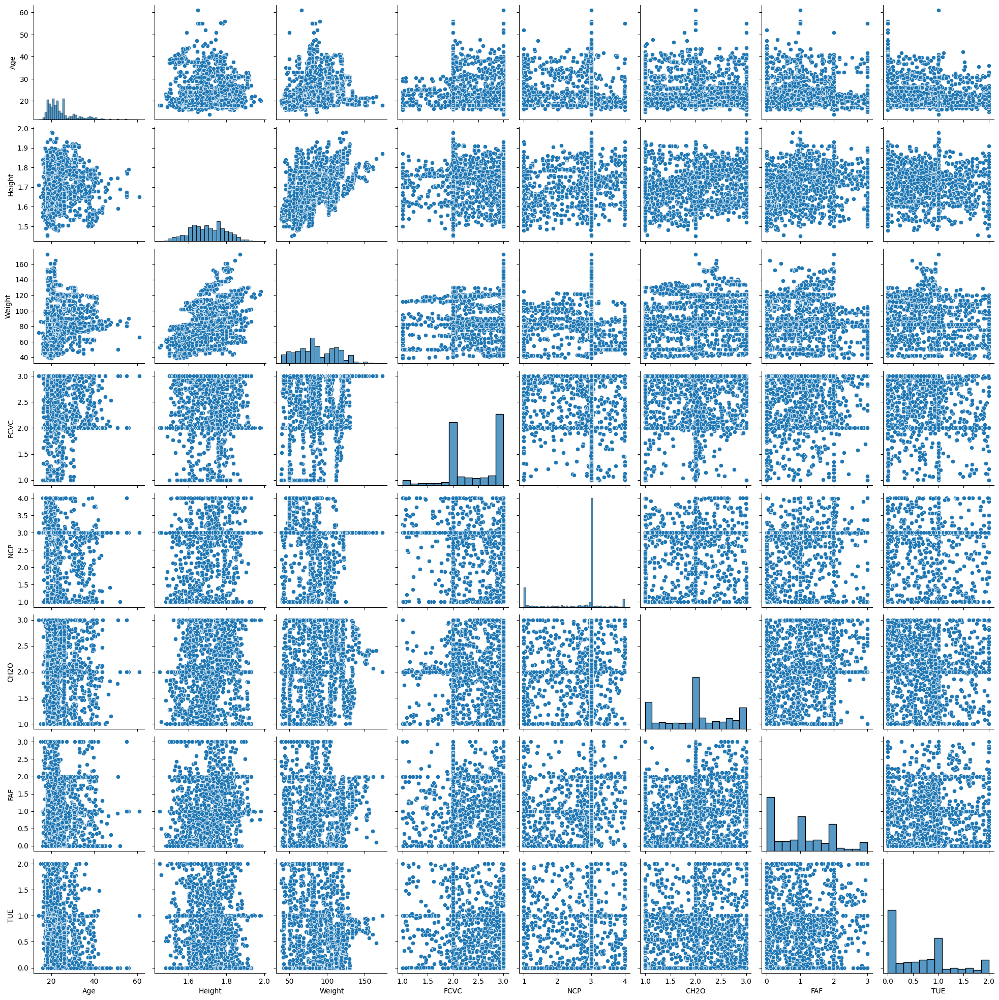

In [ ]:
# Pair plot to check the correlation between predictor variables (collinearity)
sns.pairplot(data)

Pair plots show that there is not much multicollinearity between the predictor variables.

Below are the likely distributions of the predictor variables:

<Figure size 800x500 with 0 Axes>

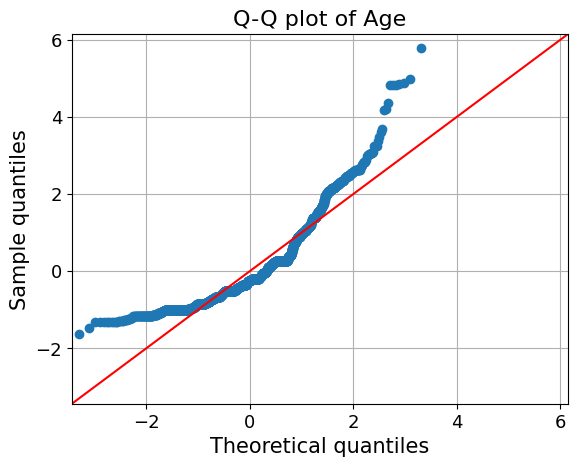

<Figure size 800x500 with 0 Axes>

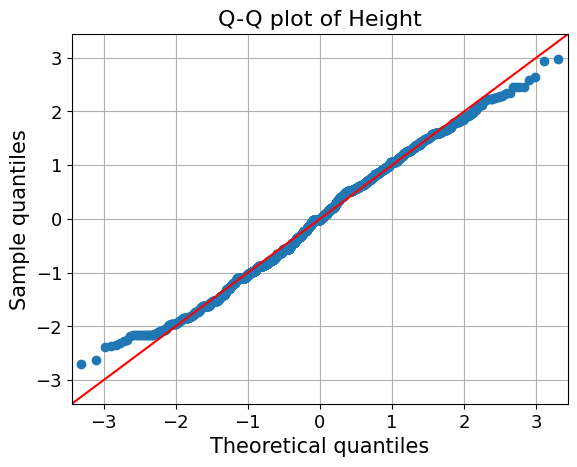

<Figure size 800x500 with 0 Axes>

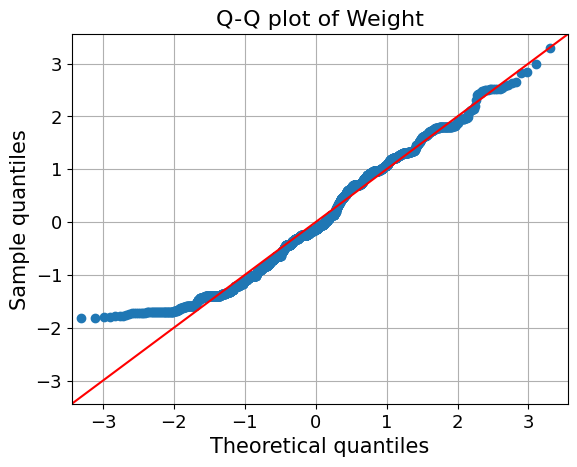

<Figure size 800x500 with 0 Axes>

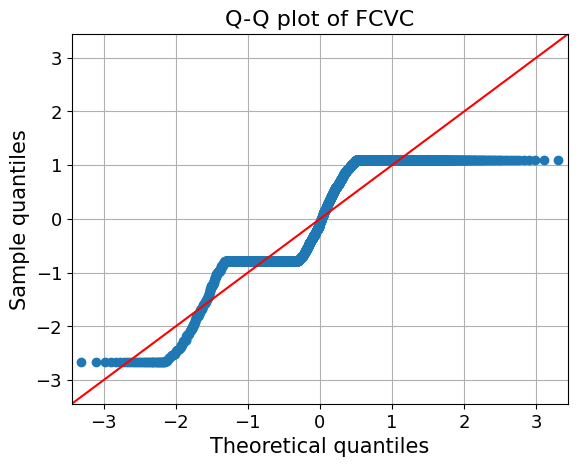

<Figure size 800x500 with 0 Axes>

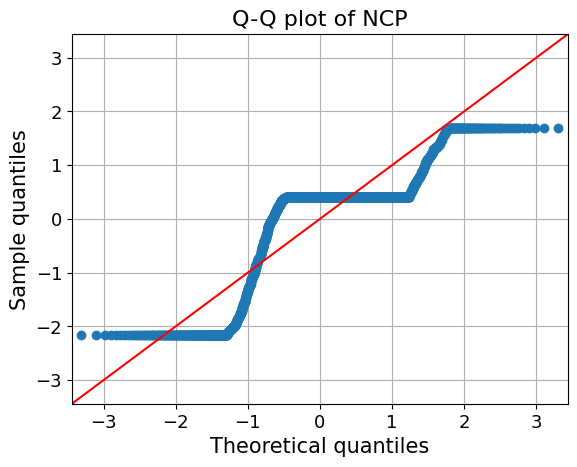

<Figure size 800x500 with 0 Axes>

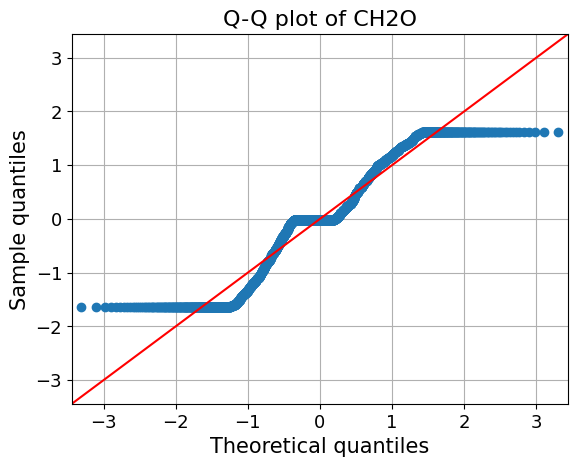

<Figure size 800x500 with 0 Axes>

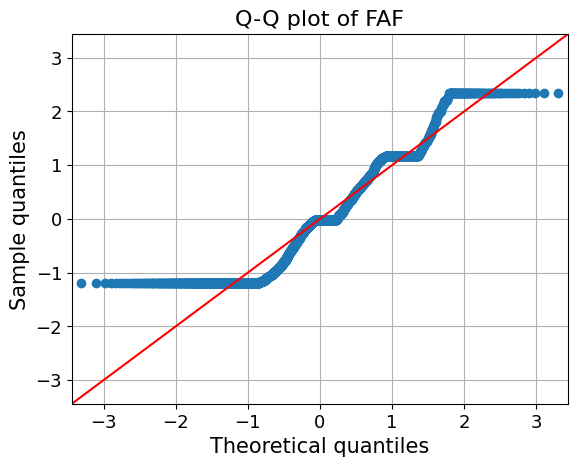

<Figure size 800x500 with 0 Axes>

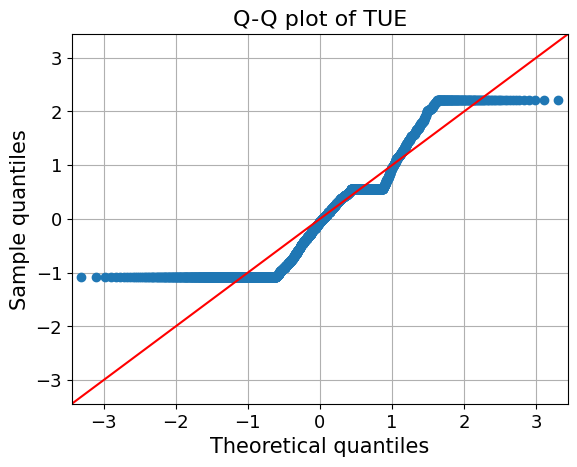

In [ ]:
# Analyzing the distribution of independent variables
data_norm = data[['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

**Distributions of the numerical predictor variables:**

Text(0.5, 0, 'Age')

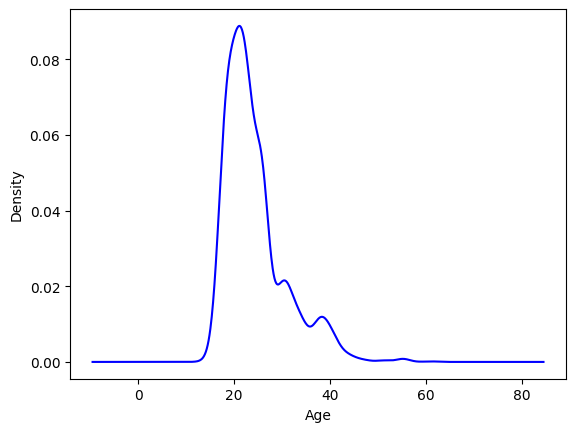

In [ ]:
# Plotting the distribution of Age
data.Age.plot.density(color="Blue")
plt.xlabel("Age")

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.13it/s]


          sumsquare_error        aic          bic  kl_div  ks_statistic  \
exponpow       131.689551  14.317713 -5833.940963     inf      0.036252   
norm           136.610477 -15.613714 -5764.150942     inf      0.047376   
gamma          136.683050 -13.915250 -5755.374873     inf      0.047894   
lognorm        136.973585 -14.391292 -5750.892469     inf      0.048924   
chi2           138.981093 -16.794445 -5720.177824     inf      0.054672   

          ks_pvalue  
exponpow   0.007593  
norm       0.000148  
gamma      0.000120  
lognorm    0.000079  
chi2       0.000006  


Text(0.5, 0, 'Height')

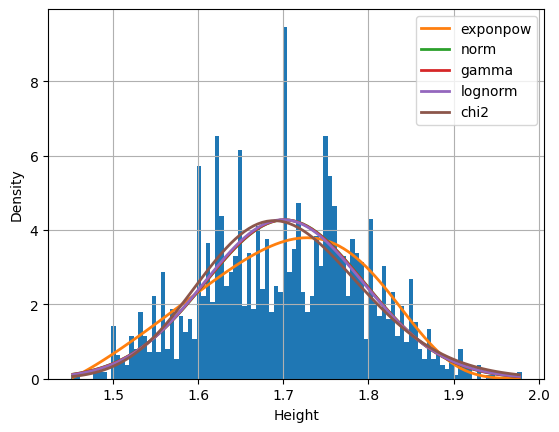

In [ ]:
# Plotting the distribution of Height
Height = data["Height"].values
f = Fitter(Height, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("Height")

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.24it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
rayleigh         0.003448  1074.879384 -28113.301906     inf      0.066568   
gamma            0.003536  1078.641844 -28052.423054     inf      0.070652   
chi2             0.003536  1078.641879 -28052.422811     inf      0.070652   
lognorm          0.003547  1085.046687 -28045.880231     inf      0.068250   
norm             0.003594  1114.007615 -28025.991374     inf      0.060316   

             ks_pvalue  
rayleigh  1.410902e-08  
gamma     1.313671e-09  
chi2      1.313624e-09  
lognorm   5.399675e-09  
norm      4.056216e-07  


Text(0.5, 0, 'Weight')

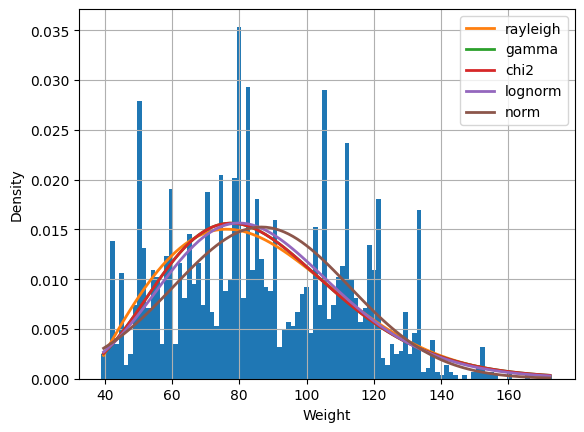

In [ ]:
# Plotting the distribution of Weight
Weight = data["Weight"].values
f = Fitter(Weight, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("Weight")

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.74it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
powerlaw       429.436946  221.279566 -3338.680574     inf      0.308858   
exponpow       443.135968  239.386318 -3272.391534     inf      0.201274   
chi2           444.806010  240.917511 -3264.450783     inf      0.170760   
gamma          444.911205  242.709849 -3263.951596     inf      0.172637   
norm           445.002412  240.837320 -3271.173801     inf      0.173713   

              ks_pvalue  
powerlaw  2.544036e-179  
exponpow   1.930385e-75  
chi2       2.750241e-54  
gamma      1.742545e-55  
norm       3.533492e-56  


Text(0.5, 0, 'FCVC')

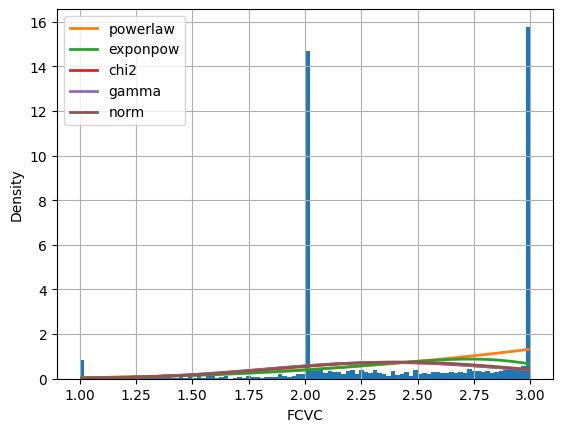

In [ ]:
# Plotting the distribution of FCVC
FCVC = data["FCVC"].values
f = Fitter(FCVC, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("FCVC")

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  3.81it/s]


          sumsquare_error         aic          bic    kl_div  ks_statistic  \
exponpow       374.768333  269.823693 -3626.128832  1.417256      0.299998   
norm           377.345206  267.182258 -3619.318378  1.410437      0.340208   
lognorm        377.369644  269.410978 -3611.526752  1.411564      0.341267   
gamma          378.011975  267.098001 -3607.936613  1.405022      0.345440   
uniform        379.596081  223.722458 -3606.763607  1.328810      0.354320   

              ks_pvalue  
exponpow  5.483764e-169  
norm      1.497507e-218  
lognorm   5.963434e-220  
gamma     1.645644e-225  
uniform   1.355757e-237  


Text(0.5, 0, 'NCP')

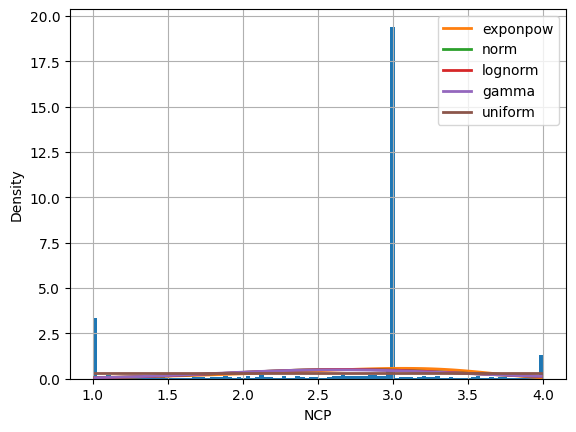

In [ ]:
# Plotting the distribution of NCP
NCP = data["NCP"].values
f = Fitter(NCP, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("NCP")

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  5.02it/s]


          sumsquare_error         aic          bic    kl_div  ks_statistic  \
powerlaw       157.685082  289.831991 -5453.638758  0.763397      0.513848   
chi2           158.322440  234.921207 -5445.123362  0.671065      0.237141   
exponpow       159.067294  213.235876 -5435.215105  0.701276      0.352606   
uniform        160.485404  142.629436 -5424.133529  0.489195      0.138217   
cauchy         161.164546  240.424403 -5415.219042  0.658700      0.110090   

              ks_pvalue  
powerlaw   0.000000e+00  
chi2      6.311160e-105  
exponpow  3.100045e-235  
uniform    1.216978e-35  
cauchy     9.739599e-23  


Text(0.5, 0, 'CH2O')

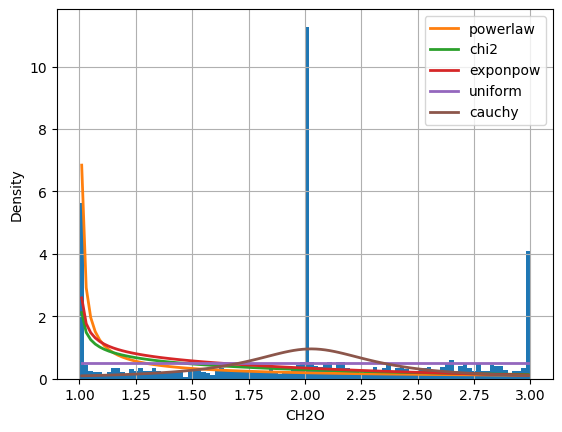

In [ ]:
# Plotting the distribution of CH2O
CH2O = data["CH2O"].values
f = Fitter(CH2O, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("CH2O")

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  4.91it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
exponpow        42.347533  417.295699 -8228.948765     inf      0.360089   
lognorm         46.599972  603.052259 -8026.947674     inf      0.404988   
gamma           55.843491  393.859187 -7644.955817     inf      0.343059   
chi2            63.382910  311.764016 -7377.616034     inf      0.243006   
expon           69.218862  302.991187 -7199.335909     inf      0.196727   

              ks_pvalue  
exponpow  1.248487e-245  
lognorm   2.683588e-313  
gamma     2.498008e-222  
chi2      3.134371e-110  
expon      4.620271e-72  


Text(0.5, 0, 'FAF')

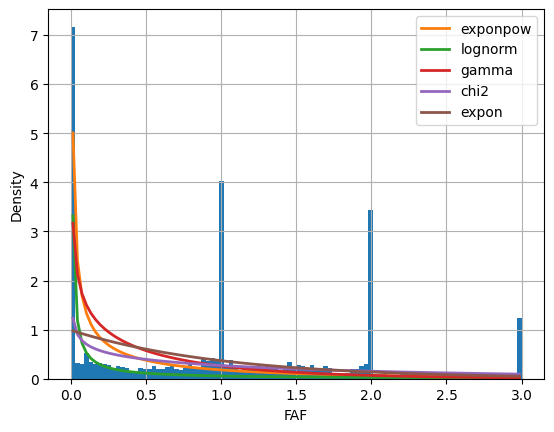

In [ ]:
# Plotting the distribution of FAF
FAF = data["FAF"].values
f = Fitter(FAF, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("FAF")

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  5.12it/s]


          sumsquare_error         aic          bic    kl_div  ks_statistic  \
exponpow       106.585939  428.732335 -6280.408306  0.695581      0.380470   
lognorm        196.396098  676.904026 -4990.203262  0.625884      0.510617   
gamma          203.158641  314.453224 -4918.738251  0.818247      0.289067   
expon          220.782286  224.262488 -4750.779230  0.657143      0.267017   
chi2           221.293354  227.160329 -4738.243405  0.581723      0.301922   

              ks_pvalue  
exponpow  3.290392e-275  
lognorm    0.000000e+00  
gamma     1.090842e-156  
expon     2.240219e-133  
chi2      3.340036e-171  


Text(0.5, 0, 'TUE')

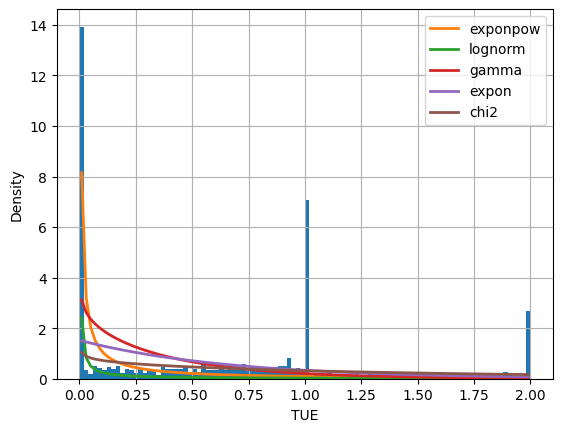

In [ ]:
# Plotting the distribution of TUE
TUE = data["TUE"].values
f = Fitter(TUE, distributions=get_common_distributions())
f.fit()
print(f.summary())
plt.ylabel("Density")
plt.xlabel("TUE")

**Distributions of the categorical predictor variables:**

<Axes: title={'center': 'family_history_with_overweight'}>

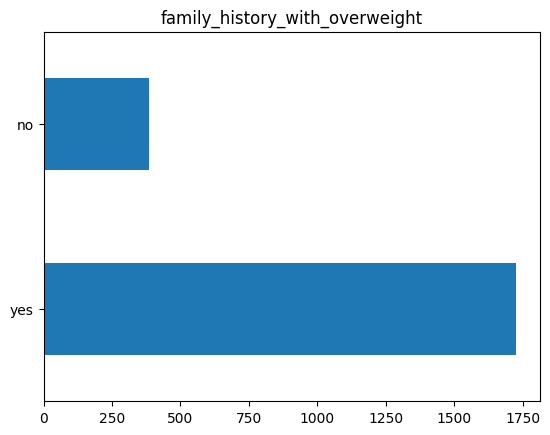

In [ ]:
# Distribution of family_history_with_overweight
plt.title("family_history_with_overweight")
data["family_history_with_overweight"].value_counts().plot(kind="barh")

<Axes: title={'center': 'FAVC'}>

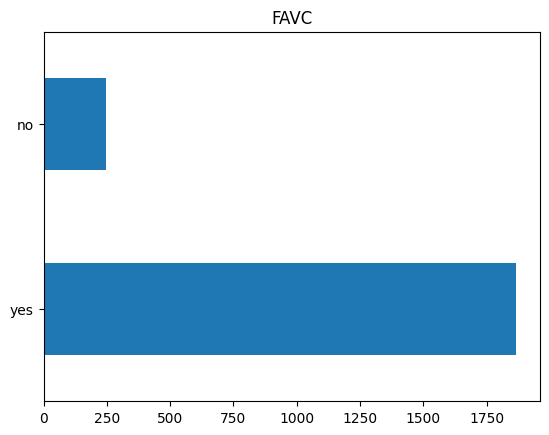

In [ ]:
# Distribution of FAVC
plt.title("FAVC")
data["FAVC"].value_counts().plot(kind="barh")

<Axes: title={'center': 'CAEC'}>

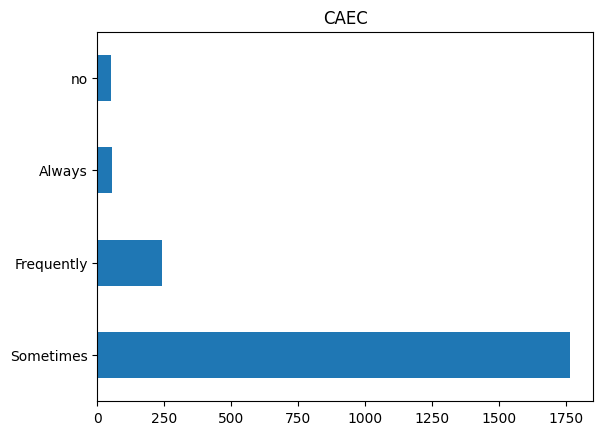

In [ ]:
# Distribution of CAEC
plt.title("CAEC")
data["CAEC"].value_counts().plot(kind="barh")

<Axes: title={'center': 'SMOKE'}>

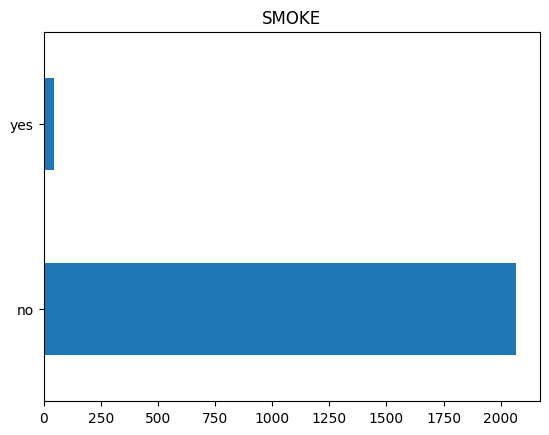

In [ ]:
# Distribution of SMOKE
plt.title("SMOKE")
data["SMOKE"].value_counts().plot(kind="barh")

<Axes: title={'center': 'SCC'}>

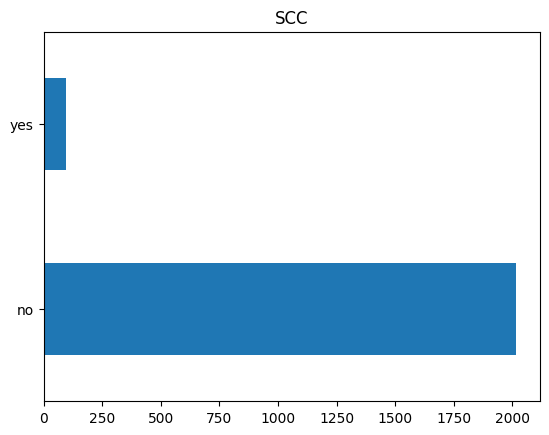

In [ ]:
# Distribution of SCC
plt.title("SCC")
data["SCC"].value_counts().plot(kind="barh")

<Axes: title={'center': 'CALC'}>

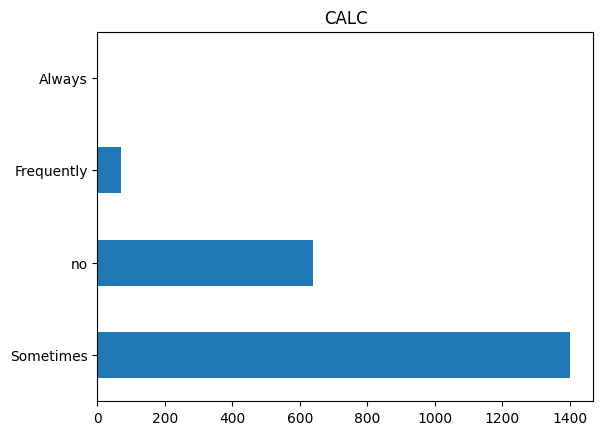

In [ ]:
# Distribution of CALC
plt.title("CALC")
data["CALC"].value_counts().plot(kind="barh")

<Axes: title={'center': 'MTRANS'}>

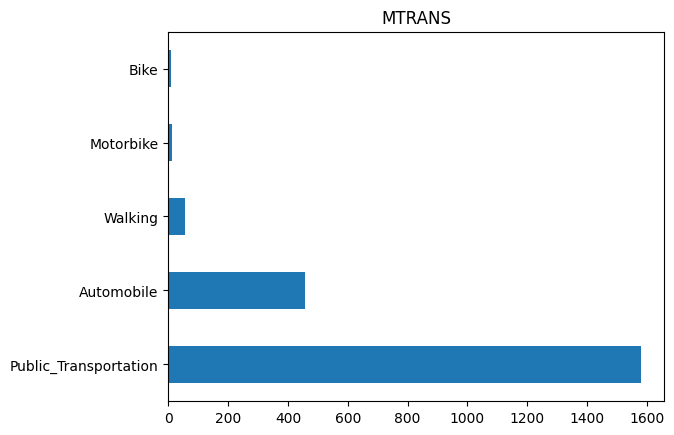

In [ ]:
# Distribution of MTRANS
plt.title("MTRANS")
data["MTRANS"].value_counts().plot(kind="barh")

In [ ]:
# Types of classes in Target variable
classes = list(data["NObeyesdad"].unique())
print(classes)

['Normal_Weight', 'Overweight_Level_I', 'Overweight_Level_II', 'Obesity_Type_I', 'Insufficient_Weight', 'Obesity_Type_II', 'Obesity_Type_III']


In [ ]:
# Getting the count of class samples and making sure there are almost equal samples for various classes.
print("Job satisfaction Count: ")
print(data.NObeyesdad.value_counts())

Job satisfaction Count: 
Obesity_Type_I         351
Obesity_Type_III       324
Obesity_Type_II        297
Overweight_Level_I     290
Overweight_Level_II    290
Normal_Weight          287
Insufficient_Weight    272
Name: NObeyesdad, dtype: int64


**Converting categorical attributes to binary values by using One-Hot and Label Encoding**

In [ ]:
# Encoding data as 1 and 0 without increasing the dimensionality of the database
one_hot = {'Male':0, 'Female':1, 'no':0, 'yes':1, 'Automobile':1, 'Bike':2, 'Motorbike':3, 'Public_Transportation':4, 'Walking':5, 
           'Insufficient_Weight':1, 'Normal_Weight':2, 'Obesity_Type_I':3, 'Obesity_Type_II':4, 'Obesity_Type_III':5, 'Overweight_Level_I':6,
           'Overweight_Level_II':7}


data.Gender = [one_hot[item] for item in data.Gender]
data.family_history_with_overweight = [one_hot[item] for item in data.family_history_with_overweight]
data.FAVC = [one_hot[item] for item in data.FAVC]
data.SMOKE = [one_hot[item] for item in data.SMOKE]
data.SCC = [one_hot[item] for item in data.SCC]
data.MTRANS = [one_hot[item] for item in data.MTRANS]
data.NObeyesdad = [one_hot[item] for item in data.NObeyesdad]


# Perform Label Encoding
le = preprocessing.LabelEncoder()

data['CAEC'] = le.fit_transform(data['CAEC'])
data['CALC'] = le.fit_transform(data['CALC'])

data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,1,21.0,1.62,64.0,1,0,2.0,3.0,2,0,2.0,0,0.0,1.0,3,4,2
1,1,21.0,1.52,56.0,1,0,3.0,3.0,2,1,3.0,1,3.0,0.0,2,4,2
2,0,23.0,1.80,77.0,1,0,2.0,3.0,2,0,2.0,0,2.0,1.0,1,4,2
3,0,27.0,1.80,87.0,0,0,3.0,3.0,2,0,2.0,0,2.0,0.0,1,5,6
4,0,22.0,1.78,89.8,0,0,2.0,1.0,2,0,2.0,0,0.0,0.0,2,4,7


<Axes: >

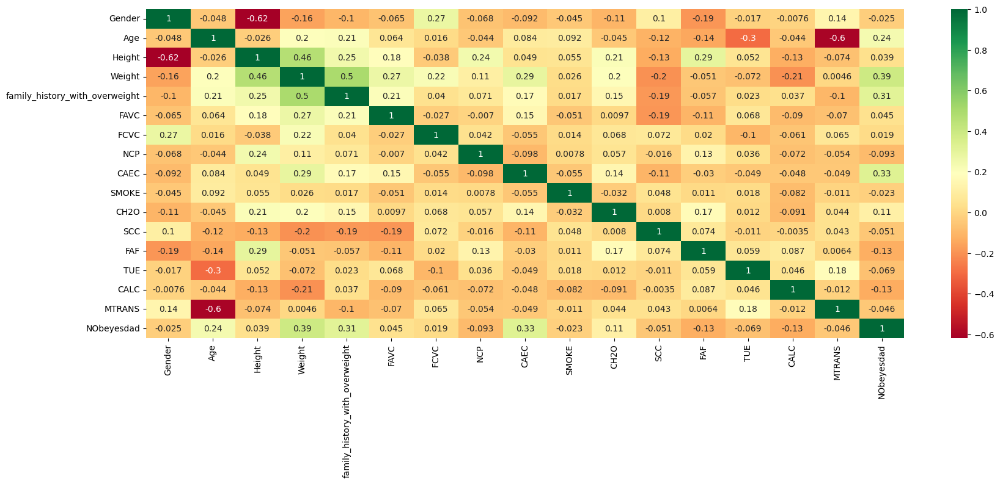

In [ ]:
# The heat map of the correlation

plt.figure(figsize=(20,7))
# Specifying the type of plot, data, colormap and annotation using sns library
sns.heatmap(data.corr(), annot=True, cmap='RdYlGn')

Heatmap of correlation matrix shows that there is not much multicollinearity between the predictor variables.

#### Checking the data for outliers and scaling

In [ ]:
# Statistical Summary of the dataset
data.describe()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,0.494079,24.312600,1.701677,86.586058,0.817622,0.883941,2.419043,2.685628,1.859308,0.020843,2.008011,0.045476,1.010298,0.657866,2.268593,3.365230,4.015632
std,0.500083,6.345968,0.093305,26.191172,0.386247,0.320371,0.533927,0.778039,0.468543,0.142893,0.612953,0.208395,0.850592,0.608927,0.515498,1.261423,1.952090
min,0.000000,14.000000,1.450000,39.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,0.000000,19.947192,1.630000,65.473343,1.000000,1.000000,2.000000,2.658738,2.000000,0.000000,1.584812,0.000000,0.124505,0.000000,2.000000,4.000000,2.000000
50%,0.000000,22.777890,1.700499,83.000000,1.000000,1.000000,2.385502,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,0.625350,2.000000,4.000000,4.000000
75%,1.000000,26.000000,1.768464,107.430682,1.000000,1.000000,3.000000,3.000000,2.000000,0.000000,2.477420,0.000000,1.666678,1.000000,3.000000,4.000000,6.000000
max,1.000000,61.000000,1.980000,173.000000,1.000000,1.000000,3.000000,4.000000,3.000000,1.000000,3.000000,1.000000,3.000000,2.000000,3.000000,5.000000,7.000000


<Axes: >

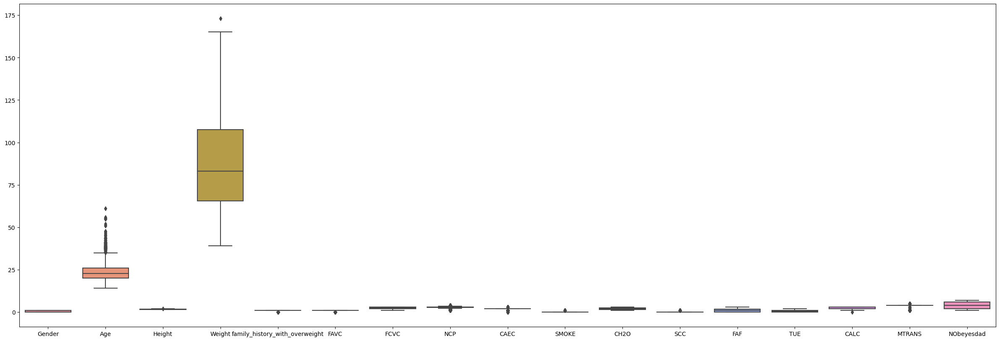

In [ ]:
# Checking the ranges of the predictor variables and dependent variable
plt.figure(figsize=(30,10))
sns.boxplot(data=data)

We need to normalizing the data in Age and Weight columns beacuse the value is too high when compared to other independent variable


In [ ]:
# Create a variable to store scaled values as floats
x_weight = data[['Weight']].values.astype(float)
y_age = data[['Age']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x_weight)
y_scaled = min_max_scaler.fit_transform(y_age)

# Run the normalizer on the dataframe
data[['Weight']] = pd.DataFrame(x_scaled)
data[['Age']] = pd.DataFrame(y_scaled)

data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,1,0.148936,1.62,0.186567,1,0,2.0,3.0,2,0,2.0,0,0.0,1.0,3,4,2
1,1,0.148936,1.52,0.126866,1,0,3.0,3.0,2,1,3.0,1,3.0,0.0,2,4,2
2,0,0.191489,1.80,0.283582,1,0,2.0,3.0,2,0,2.0,0,2.0,1.0,1,4,2
3,0,0.276596,1.80,0.358209,0,0,3.0,3.0,2,0,2.0,0,2.0,0.0,1,5,6
4,0,0.170213,1.78,0.379104,0,0,2.0,1.0,2,0,2.0,0,0.0,0.0,2,4,7


<Axes: >

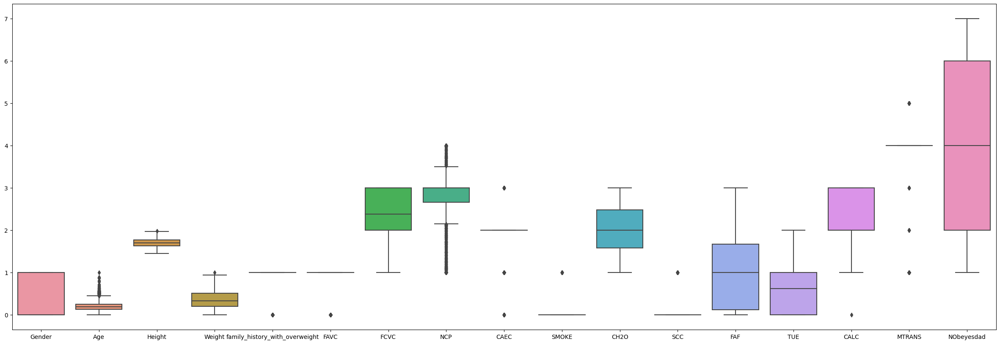

In [ ]:
# Checking the ranges of the predictor variables and dependent variable after Normalizing
plt.figure(figsize=(30,10))
sns.boxplot(data=data)

As we can see our current data has outliers as well. This might have some impact on model performance. One of the ways to overcome this is using regularization for our model.

**Train, Validation, and Test split**

In [ ]:
# Define predictor and predicted datasets

# Specifying the predicted value 
y = data[['NObeyesdad']]

# Specifying the predictor values and dropping NObeyesdad from data
x = data.drop(['NObeyesdad'], axis = 1)

print(x.head())

   Gender       Age  Height    Weight  family_history_with_overweight  FAVC  \
0       1  0.148936    1.62  0.186567                               1     0   
1       1  0.148936    1.52  0.126866                               1     0   
2       0  0.191489    1.80  0.283582                               1     0   
3       0  0.276596    1.80  0.358209                               0     0   
4       0  0.170213    1.78  0.379104                               0     0   

   FCVC  NCP  CAEC  SMOKE  CH2O  SCC  FAF  TUE  CALC  MTRANS  
0   2.0  3.0     2      0   2.0    0  0.0  1.0     3       4  
1   3.0  3.0     2      1   3.0    1  3.0  0.0     2       4  
2   2.0  3.0     2      0   2.0    0  2.0  1.0     1       4  
3   3.0  3.0     2      0   2.0    0  2.0  0.0     1       5  
4   2.0  1.0     2      0   2.0    0  0.0  0.0     2       4  


In [ ]:
# Spliting data into Training set 76.5%, Validation set 13.5% and Test set 10%

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=1)
x_t, x_val, y_t, y_val = train_test_split(x_train, y_train, test_size=0.15, random_state=1)

### Linear Model

In [ ]:
# Define Logistic Regression classifier model
clf_lr = LogisticRegression(random_state=0, multi_class='multinomial', solver='newton-cg')

# Training the model
clf_lr.fit(x_train, y_train.values.ravel())

# Predictions on test dataset
y_prediction_lr = clf_lr.predict(x_test)

# Calculate accuracy
accuracy_lr = accuracy_score(y_test, y_prediction_lr)

# Print accuracy
print("Accuracy:", accuracy_lr)

Accuracy: 0.6886792452830188


##### Interpreting Regression Co-efficients - OLS Summary

To better understand if the x values and y values don't have a null hypothesis, we use OLS Summary.


Note: Null hypothesis is a test to determine if the X and Y value share some sort of relation between each other.


To determine this we will look at F-Statistic of the OLS Summary. If the value is 0 then there is no relationship between the X and Y value. If the value is greater than 0 it means there is a relationship. The higher the value of F-statistic, the stronger the relationship between the X and Y value.

In [ ]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df1 = data.drop("NObeyesdad", axis=1)
df_norm = (df1 - df1.min()) / (df1.max() - df1.min())
df_norm = pd.concat((df_norm, data.NObeyesdad), 1)

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.


In [ ]:
import statsmodels.formula.api as sm

results = sm.ols(
    "NObeyesdad  ~ Gender + Age + Height + Weight + family_history_with_overweight + FAVC + FCVC + NCP + CAEC + SMOKE + CH2O + SCC + FAF + TUE + CALC + MTRANS",
    data=df_norm,
).fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:             NObeyesdad   R-squared:                       0.286
Model:                            OLS   Adj. R-squared:                  0.281
Method:                 Least Squares   F-statistic:                     52.54
Date:                Mon, 10 Apr 2023   Prob (F-statistic):          1.52e-140
Time:                        02:55:30   Log-Likelihood:                -4050.7
No. Observations:                2111   AIC:                             8135.
Df Residuals:                    2094   BIC:                             8231.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

**Coefficient:**

It represents the expected change in the target variable for a one-unit change in the predictor variable, while holding all other predictor variables constant.

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors.

As seen in the co-efficient column in the above table:
* value for the variable Weight is highest, i.e 2.9433
* it is followed by CAEC, i.e 2.5629

These variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target (Obesity Estimation)

**P-Values:**

It is the probability of observing a t-value as extreme as the one calculated from the sample data, assuming the null hypothesis that the coefficient is zero.

Small p-values (less than 0.05) indicate strong evidence against the null hypothesis and suggest that the coefficient is statistically significant.

* Age
* Height
* Weight
* family_history_with_overweight
* FAVC
*CAEC

These variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target (Obesity Estimation).

**Skew and Kurtosis:**

Skewness measures the extent and direction of departure from the central axis, while Kurtosis measures the height and sharpness of the central peak. The ideal value for both of these measures is 0. In this scenario, the values of Skew and Kurtosis are 0.589 and 2.245, respectively.

**Durbin-Watson:**

It is a test to check the presence of autocorrelation (serial correlation) in the residuals of the regression model. It ranges from 0 to 4.

Here, the model has a Durbin-Watson score of 0.617 which could be interpreted as a positive auto-correlation in the residuals of regression.

### Tree-based Model

In [ ]:
# Creating a Random Forest classifier object
clf_rf = RandomForestClassifier(max_depth=3, random_state=0, n_estimators = 100)  
  
# Training the model
clf_rf.fit(x_train, y_train)
  
# Predicton on test dataset using Random Forest classifier
print("Predicted values:")
y_prediction_rf = clf_rf.predict(x_test)
print(y_prediction_rf)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Predicted values:
[1 1 2 5 4 5 4 5 3 7 7 4 4 4 2 3 3 4 3 3 3 6 7 4 4 3 4 3 7 4 4 5 7 3 1 3 1
 1 7 7 2 7 3 2 1 5 1 1 2 4 5 3 1 3 5 3 1 5 1 7 1 4 5 3 2 2 5 4 7 4 3 1 5 5
 4 4 1 7 4 5 6 3 5 2 1 3 1 5 2 5 7 3 5 3 1 4 1 6 5 5 1 7 3 2 5 7 2 4 7 3 4
 3 2 1 7 7 5 3 1 1 3 3 4 3 5 5 6 4 5 7 3 6 4 4 5 3 1 5 6 4 4 1 7 2 1 5 7 7
 5 5 3 3 1 7 6 6 5 1 7 4 3 5 1 4 5 2 7 1 3 1 7 5 7 6 5 4 3 4 7 3 3 6 7 2 3
 4 4 4 5 4 7 3 4 2 3 5 5 3 1 7 7 4 6 1 2 3 1 1 3 4 2 2]


In [ ]:
# Calculate accuracy
print("Confusion Matrix: ", confusion_matrix(y_test, y_prediction_rf))
print("Accuracy of Random Forest classifier: ", accuracy_score(y_test, y_prediction_rf)*100)
print("Report : ", classification_report(y_test, y_prediction_rf))

Confusion Matrix:  [[29  1  1  0  0  0  0]
 [ 4 10  2  0  0  0  3]
 [ 0  1 21 15  2  2  6]
 [ 0  0  0 23  0  0  0]
 [ 0  0  0  0 33  0  0]
 [ 1  5  9  0  0  8  5]
 [ 0  2  9  0  2  1 17]]
Accuracy of Random Forest classifier:  66.50943396226415
Report :                precision    recall  f1-score   support

           1       0.85      0.94      0.89        31
           2       0.53      0.53      0.53        19
           3       0.50      0.45      0.47        47
           4       0.61      1.00      0.75        23
           5       0.89      1.00      0.94        33
           6       0.73      0.29      0.41        28
           7       0.55      0.55      0.55        31

    accuracy                           0.67       212
   macro avg       0.66      0.68      0.65       212
weighted avg       0.66      0.67      0.65       212



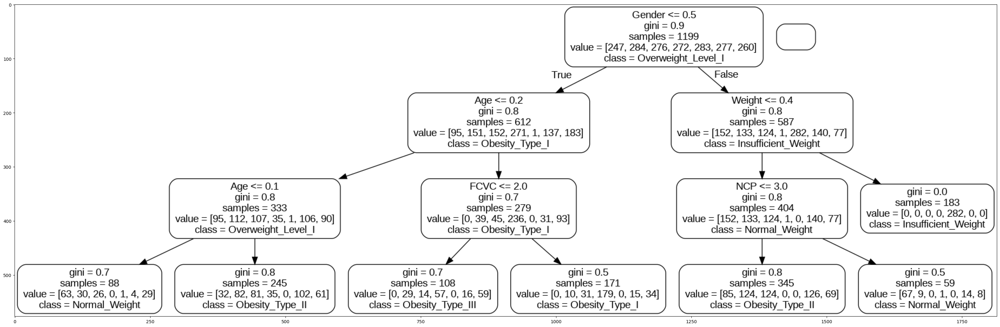

In [ ]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(40, 30), dpi=100)
tree = clf_rf.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    class_names=classes,
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

##### Interpreting Nodes of a Tree-Based Model


Interpreting the tree involves examining the nodes and edges to understand how the model is making decisions. Each node in the tree represents a decision point based on a specific feature and threshold value. The top node, or root, represents the starting point of the decision process, and each subsequent node represents a decision based on a feature.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as Leaf 1.

</br>


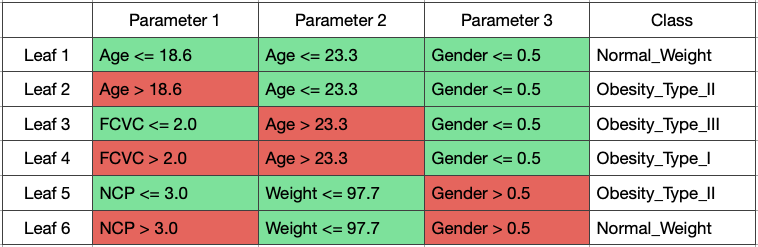

</br>
If the condition represented by the node is true (green cells), the model follows the left branch, while if the condition is false (red cells), the model follows the right branch. At the end of each branch is a leaf node, which represents the final predicted class (Obesity Estimation).

### AutoML

In [ ]:
# Initialize the H2O cluster
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpy76jllbi
  JVM stdout: /tmp/tmpy76jllbi/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpy76jllbi/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_c3400d
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
# Convert Pandas Dataframe to H2O dataframe
df = h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Split the dataset into train and test set
df_train, df_test = df.split_frame(ratios=[0.8], seed = 1)

print(df_train.shape)
print(df_test.shape)

(1687, 17)
(424, 17)


In [ ]:
X1 = df.columns
print(X1)

['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad']


In [ ]:
# Set target variable
y1 = "NObeyesdad"

# Remove the target variable from predictor variables
X1.remove(y1) 
print(X1)

['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS']


In [ ]:
# Setting of AutoML
aml = H2OAutoML(max_models = 10, max_runtime_secs = 300, seed=1)

In [ ]:
# Train the dataset on different models
aml.train(x=X1, y=y1, training_frame=df_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),5/10
# GBM base models (used / total),3/4
# XGBoost base models (used / total),2/3
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [ ]:
lb = aml.leaderboard
lb.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_1_20230410_25552,0.570026,0.324929,0.305264,0.126383,0.324929
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_25552,0.572229,0.327446,0.309875,0.126768,0.327446
GBM_3_AutoML_1_20230410_25552,0.589545,0.347563,0.320667,0.129668,0.347563
GBM_2_AutoML_1_20230410_25552,0.606521,0.367868,0.33588,0.133754,0.367868
GBM_4_AutoML_1_20230410_25552,0.634003,0.40196,0.349488,0.136757,0.40196
XGBoost_2_AutoML_1_20230410_25552,0.642015,0.412183,0.357968,0.140018,0.412183
XGBoost_1_AutoML_1_20230410_25552,0.708043,0.501325,0.433871,0.163405,0.501325
DRF_1_AutoML_1_20230410_25552,0.730393,0.533474,0.40727,0.153859,0.533474
XGBoost_3_AutoML_1_20230410_25552,0.768384,0.590414,0.457748,0.176297,0.590414
XRT_1_AutoML_1_20230410_25552,0.768926,0.591247,0.508132,0.157219,0.591247


In [ ]:
# Assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict={}
for m in aml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict

{'StackedEnsemble_AllModels_1_AutoML_1_20230410_25552': 0,
 'StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_25552': 1,
 'GBM_3_AutoML_1_20230410_25552': 2,
 'GLM_1_AutoML_1_20230410_25552': 11}

In [ ]:
# Best Model
autoML_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
print(autoML_model.algo)

gbm


In [ ]:
autoML_model

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_3_AutoML_1_20230410_25552


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    75                 75                          48773                  8            8            8             15            83            47.1333

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.06812247380853251
RMSE: 0.26100282337272235
MAE: 0.14513251734825727
RMSLE: 0.06143228891483842
Mean Residual Deviance: 0.06812247380853251

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.34756289770033644
RMSE: 0.58954465284687
MAE: 0.3206668576266761
RMSLE: 0.12966809989053596
Mean Residual Deviance: 0.34756289770033644

Cross-Validation Metrics Summary: 
                        mean      sd         cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ---------  ------------  ------------  ------------  ------------  ------------
mae                     0.320897  0.0246784  0.289095      0.317267      0.306978      0.345536      0.345611
mean_residual_deviance  0.348611  0.0931614  0.243281      0.338464      0.277088      0.420677      0.463545
mse                     0.348611  0.0931614  0.243281      0.338464      0.277088      0.420677      0.463545
r2                      0.908271  0.0243427  0.936148      0.910269      0.926795      0.890187      0.877956
residual_deviance       0.348611  0.0931614  0.243281      0.338464      0.277088      0.420677      0.463545
rmse                    0.586168  0.079198   0.493236      0.581776      0.526392      0.648596      0.680842
rmsle                   0.129556  0.011684   0.118282      0.132824      0.116174      0.139776      0.140725

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-10 02:56:39  4.559 sec   0                  1.94924          1.66138         3.79953
    2023-04-10 02:56:40  4.634 sec   5                  1.43258          1.22917         2.05229
    2023-04-10 02:56:40  4.705 sec   10                 1.01614          0.85017         1.03254
    2023-04-10 02:56:40  4.793 sec   15                 0.731676         0.579565        0.53535
    2023-04-10 02:56:40  4.885 sec   20                 0.576642         0.422507        0.332516
    2023-04-10 02:56:40  4.962 sec   25                 0.471292         0.311354        0.222116
    2023-04-10 02:56:40  5.019 sec   30                 0.411304         0.250588        0.169171
    2023-04-10 02:56:40  5.079 sec   35                 0.376182         0.214616        0.141513
    2023-04-10 02:56:40  5.167 sec   40                 0.355373         0.199198        0.12629
    2023-04-10 02:56:40  5.239 sec   45                 0.339781         0.188779        0.115451
    2023-04-10 02:56:40  5.310 sec   50                 0.327132         0.181726        0.107016
    2023-04-10 02:56:40  5.382 sec   55                 0.307333         0.170385        0.0944535
    2023-04-10 02:56:40  5.447 sec   60                 0.29234          0.162083        0.0854628
    2023-04-10 02:56:40  5.517 sec   65                 0.281356         0.156699        0.0791611
    2023-04-10 02:56:40  5.586 sec   70                 0.270421         0.150164        0.0731275
    2023-04-10 02:56:41  5.642 sec   75                 0.261003         0.145133        0.0681225

Variable Importances: 
variable                        relative_importance    scaled_importance    percentage
-----------------------------

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

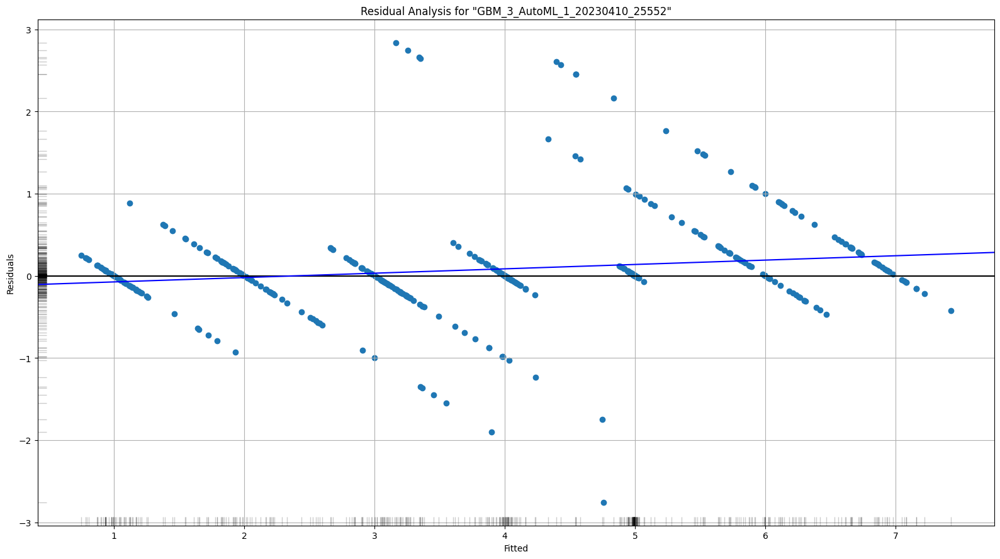

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

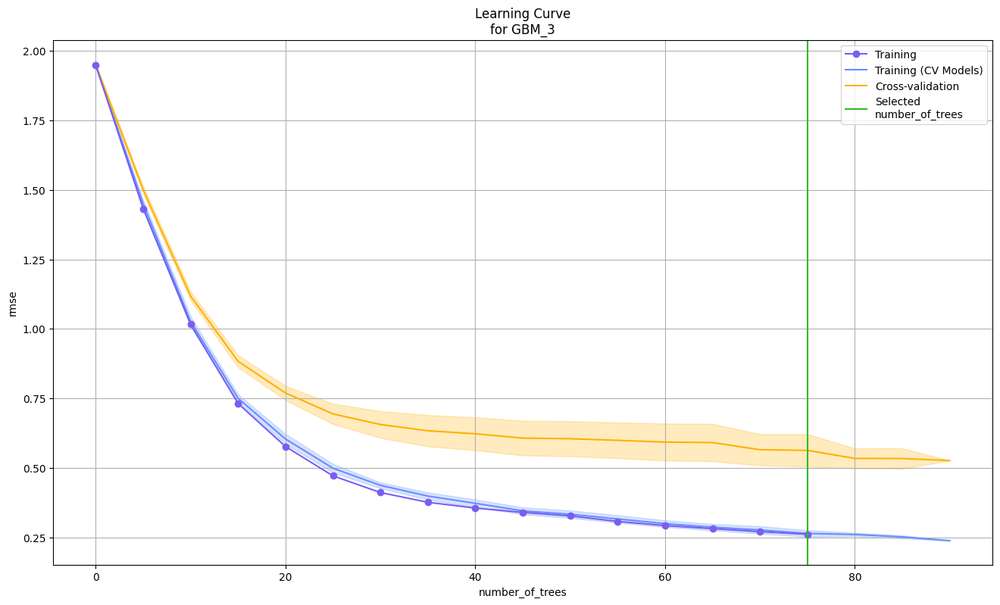

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

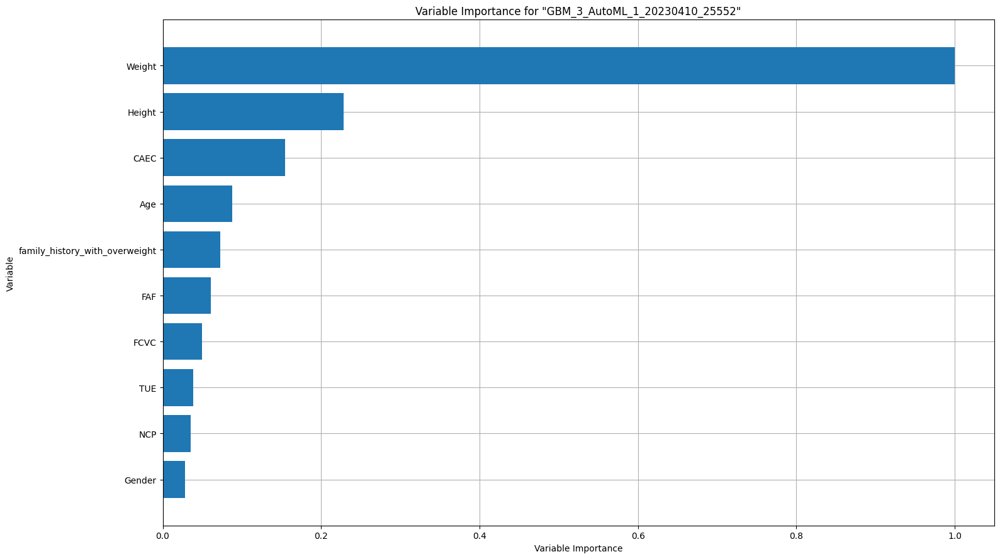

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

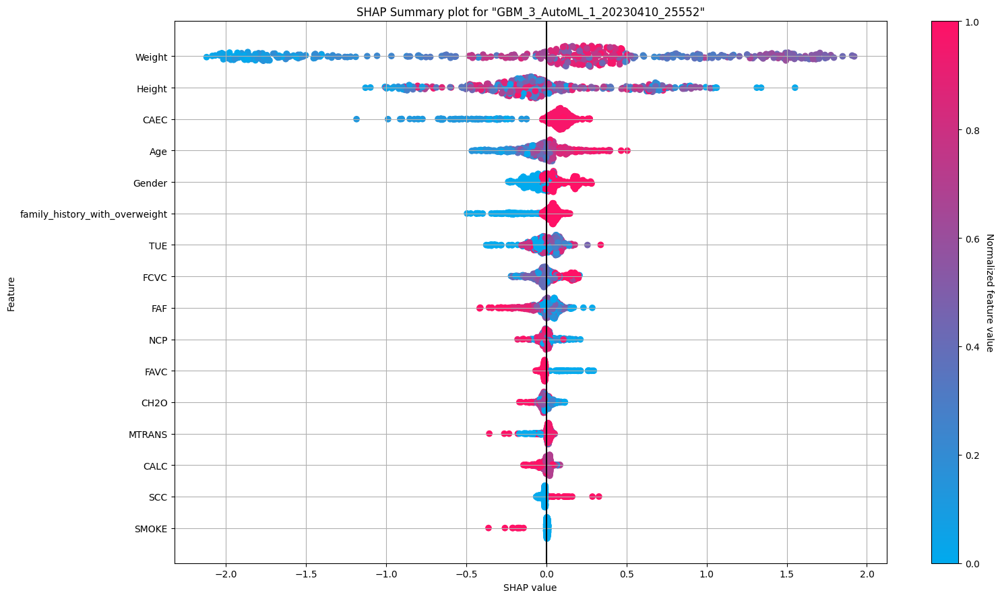

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

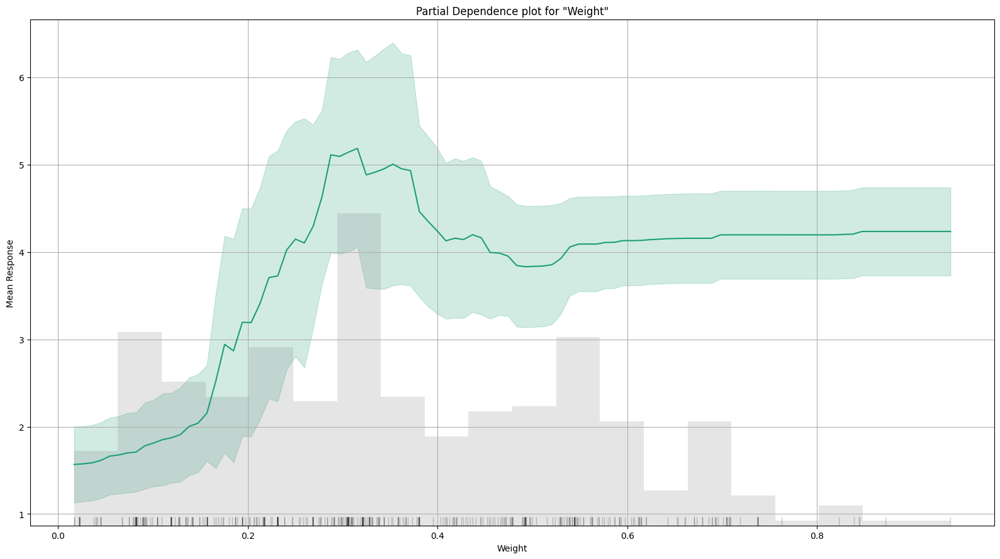

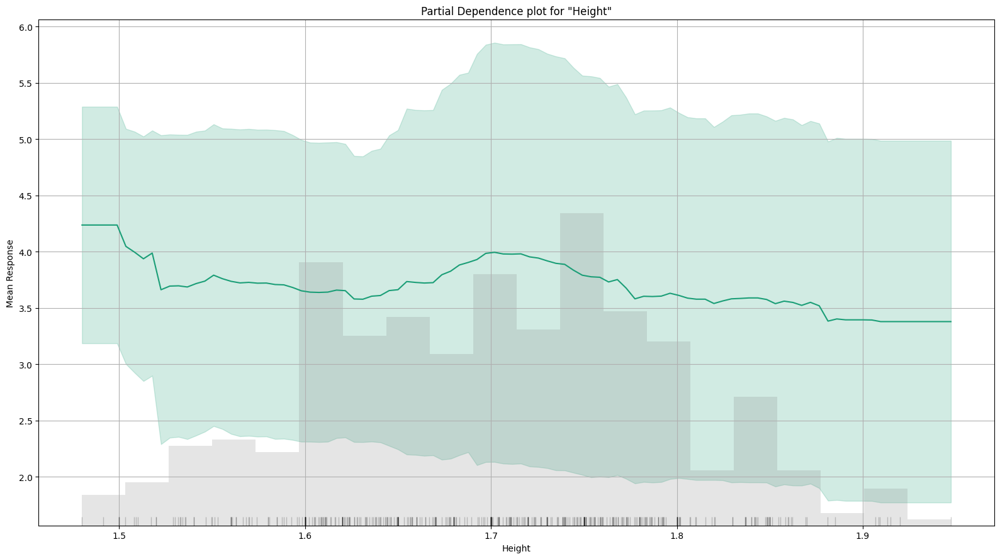

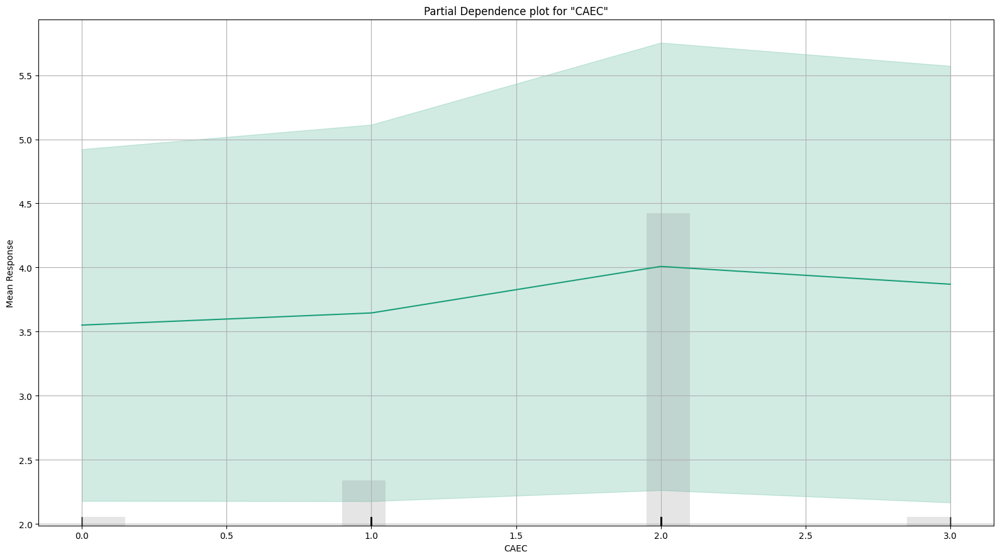

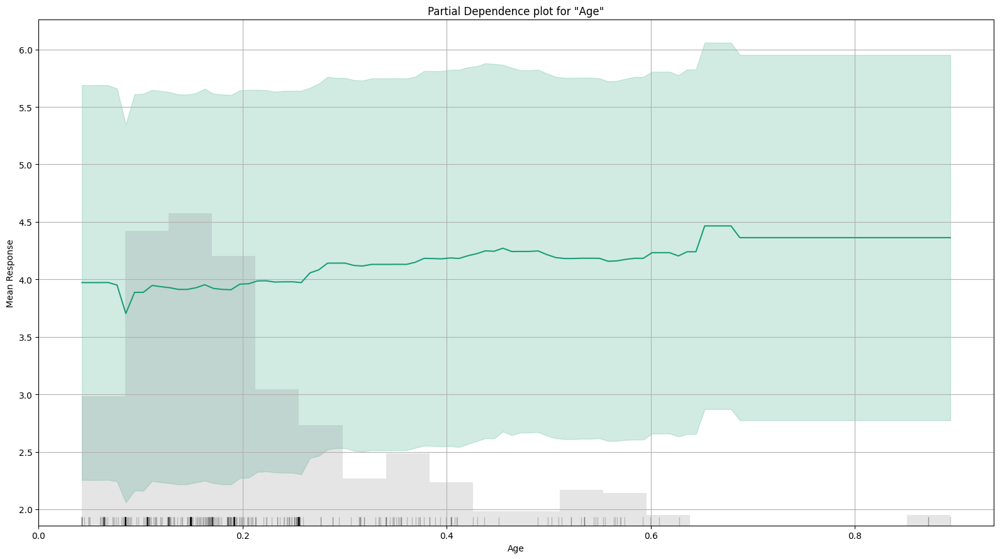

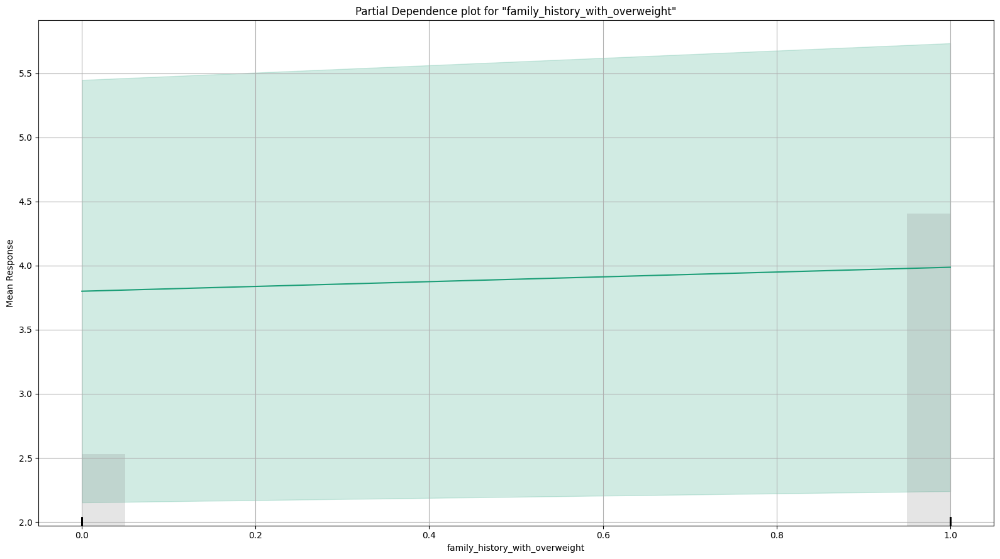

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

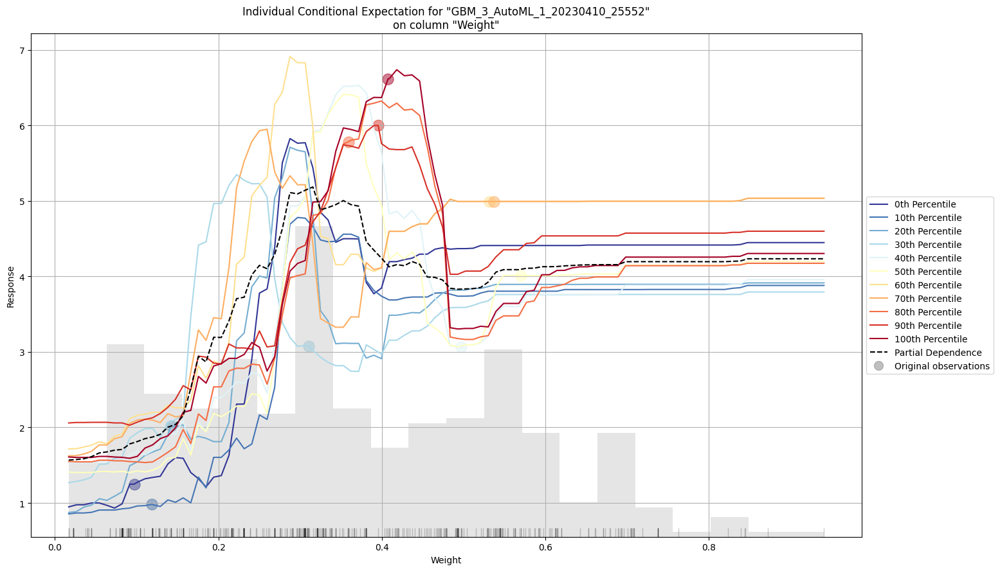

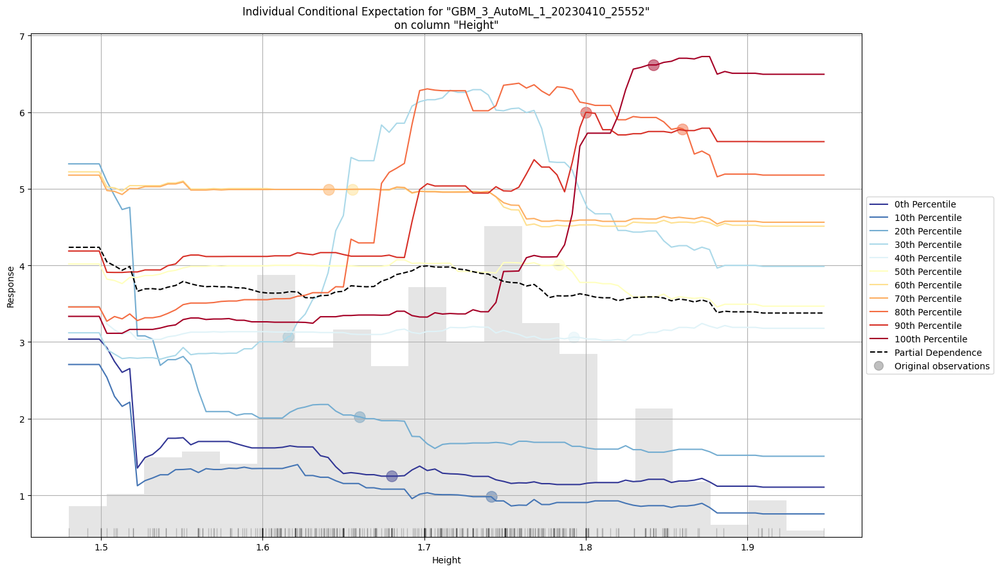

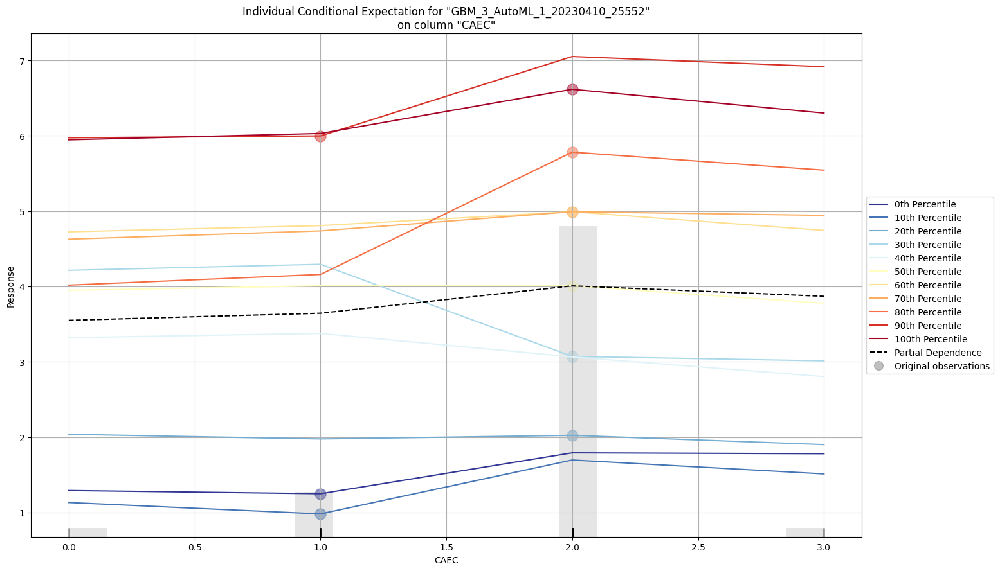

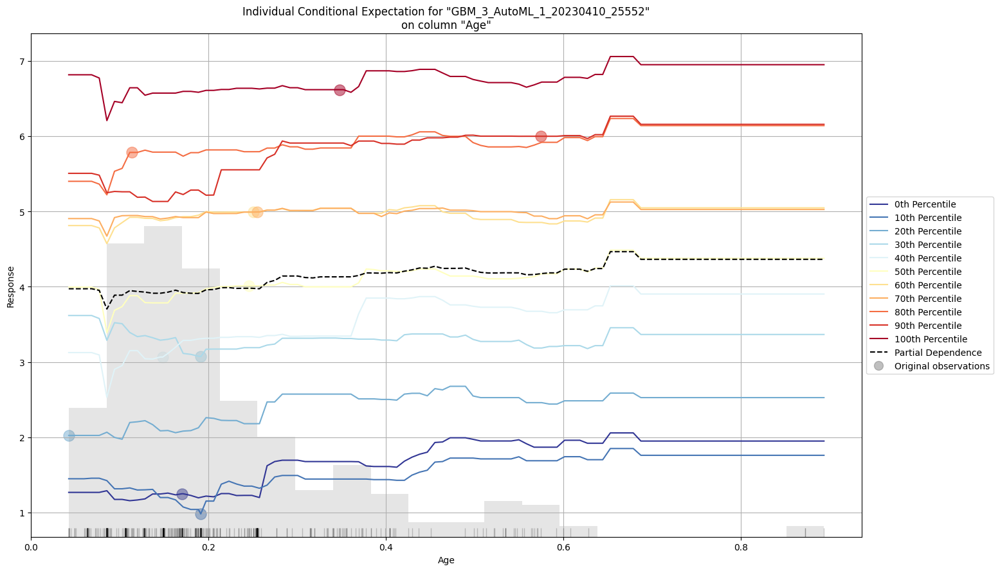

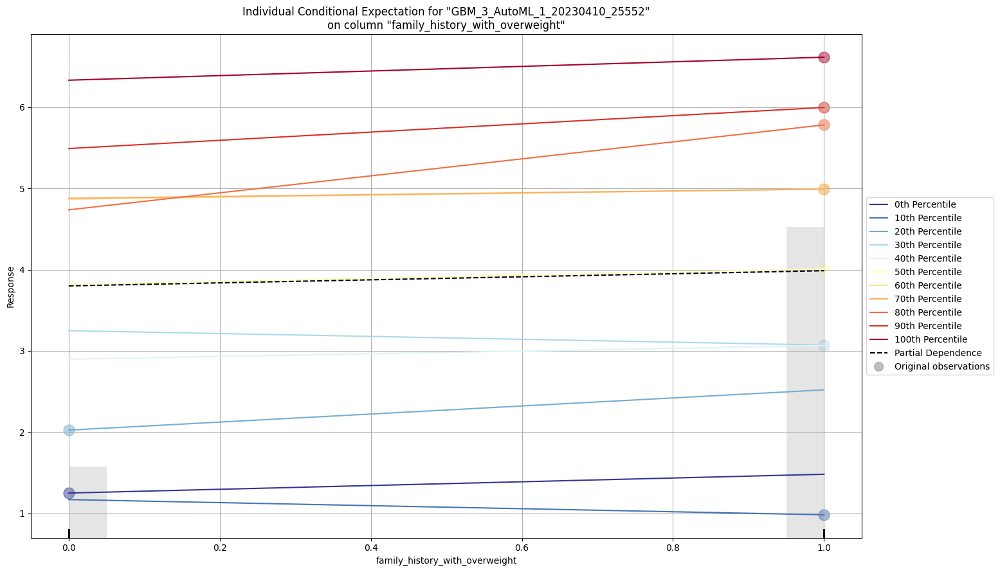

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [ ]:
autoML_model.explain(df_test)

In [ ]:
# Model performance of GBM model on test data
autoML_model.model_performance(df_test)

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.3447913111710689
RMSE: 0.5871893316223218
MAE: 0.3133447338325419
RMSLE: 0.11919237010123195
Mean Residual Deviance: 0.3447913111710689

##### Interpreting Best Model from AutoML

**Variable Importance:**

From above, we can see that the value of the target variable (NObeyesdad) is highly dependant on Weight. The result is same as what we got from the Linear and Tree-based Model.

**SHAP Summary:**

We can interpret the following from the SHAP Summary:

* Higher value of Weight tends to have a positive impact on the estimation of obesity
* Lower value of FAVC (frequency of eating high caloric food) tends to have a positive impact on the estimation of obesity
* Higher value of Age tends to have a positive impact on the estimation of obesity

There is not much difference in the SHAP Summary plot of for Linear and Tree-based Model (see cell 99 and 100).

#### Hyperparameter Tuning on GBM model using Random Grid Search Method

In [ ]:
train, validate, test = np.split(
    data.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [ ]:
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.gbm import H2OGradientBoostingEstimator

search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

gbm_grid11 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid12",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [ ]:
gbm_grid11.train(
    x=X1, y=y1, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.9,0.09,8.0,0.9,gbm_grid12_model_36,0.4094429
,0.9,0.09,9.0,0.6000000,gbm_grid12_model_3,0.4344422
,0.8,0.03,9.0,0.9,gbm_grid12_model_8,0.4445391
,0.8,0.06,9.0,0.6000000,gbm_grid12_model_30,0.4462906
,0.9,0.03,10.0,0.5,gbm_grid12_model_21,0.5198961
,0.5,0.1,9.0,1.0,gbm_grid12_model_7,0.5262821
,0.5,0.05,7.0,0.9,gbm_grid12_model_2,0.5426055
,0.7000000,0.03,6.0,1.0,gbm_grid12_model_6,0.6252244
,0.9,0.07,4.0,0.9,gbm_grid12_model_17,0.6851456
,0.9,0.1,4.0,0.7000000,gbm_grid12_model_15,0.6925999


In [ ]:
gbm_gridperf11 = gbm_grid11.get_grid(sort_by="residual_deviance", decreasing=False)
gbm_gridperf11

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.9,0.09,8.0,0.9,gbm_grid12_model_36,0.4094429
,0.9,0.09,9.0,0.6000000,gbm_grid12_model_3,0.4344422
,0.8,0.03,9.0,0.9,gbm_grid12_model_8,0.4445391
,0.8,0.06,9.0,0.6000000,gbm_grid12_model_30,0.4462906
,0.9,0.03,10.0,0.5,gbm_grid12_model_21,0.5198961
,0.5,0.1,9.0,1.0,gbm_grid12_model_7,0.5262821
,0.5,0.05,7.0,0.9,gbm_grid12_model_2,0.5426055
,0.7000000,0.03,6.0,1.0,gbm_grid12_model_6,0.6252244
,0.9,0.07,4.0,0.9,gbm_grid12_model_17,0.6851456
,0.9,0.1,4.0,0.7000000,gbm_grid12_model_15,0.6925999


In [ ]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf11.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [ ]:
models = gbm_gridperf11.models

list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [ ]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)

print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.9        0.09          8          0.9           0.409443
1               0.9        0.09          9          0.6           0.434442
2               0.8        0.03          9          0.9           0.444539
3               0.8        0.06          9          0.6           0.446291
4               0.9        0.03         10          0.5           0.519896
5               0.5        0.10          9          1.0           0.526282
6               0.5        0.05          7          0.9           0.542605
7               0.7        0.03          6          1.0           0.625224
8               0.9        0.07          4          0.9           0.685146
9               0.9        0.10          4          0.7           0.692600
10              0.4        0.08          6          0.9           0.703358
11              0.6        0.10          4          1.0           0.761615
12              0.7      

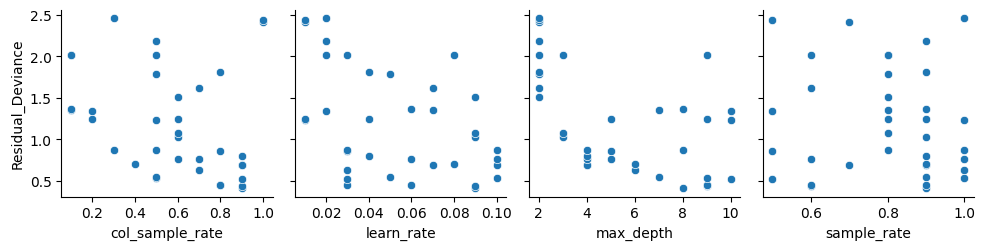

In [ ]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

Based on the results, the hyperparameter combination with the lowest Residual Deviance was a model with col_sample_rate of 0.9, learn_rate of 0.09, max_depth of 8, and sample_rate of 0.9, with a Residual Deviance of 0.41. Whereas, the worst-performing model had Residual Deviance of 2.46. Hence, hyperparameter tuning has significant effect on the learning model.

### Feature Importance and Selection

Feature Selection is the process of selecting the features which are relevant to an ML model. It means that we select only those attributes that have a significant effect on the model's output.

A feature importance plot is a type of visualization that shows the relative importance of each input variable in a machine learning model. It is used to understand the degree to which each feature contributes to the overall predictive power of the model.

Three methods used to predict feature importance:

* Partial Dependence Plots: Graphical representation of the marginal effect of a feature on the prediction of a model.
* Shapley Values: A cooperative game theory approach that allocates the contribution of each feature to the prediction of the model in a fair manner.


NOTE: Partial Dependence Plots and Shapley Values can also be used for model interpretability.

#### Partial Dependence Plots

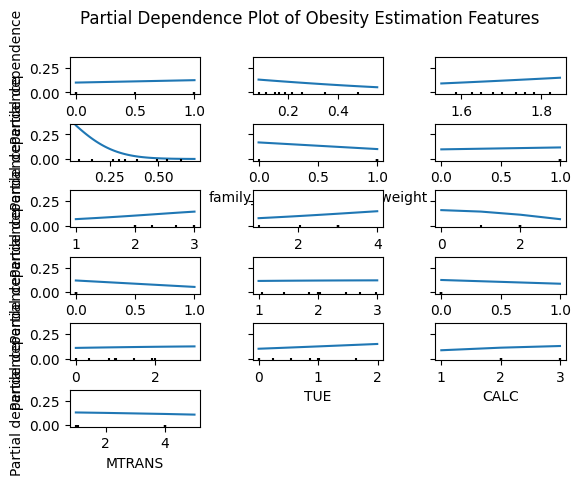

In [ ]:
# PDP Plot for Linear Model
PartialDependenceDisplay.from_estimator(
    clf_lr,
    x_test,
    features=list(x_test.columns),
    target=clf_lr.classes_[0],
    n_jobs=3
)

fig = plt.gcf()
fig.suptitle("Partial Dependence Plot of Obesity Estimation Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (40, 30)

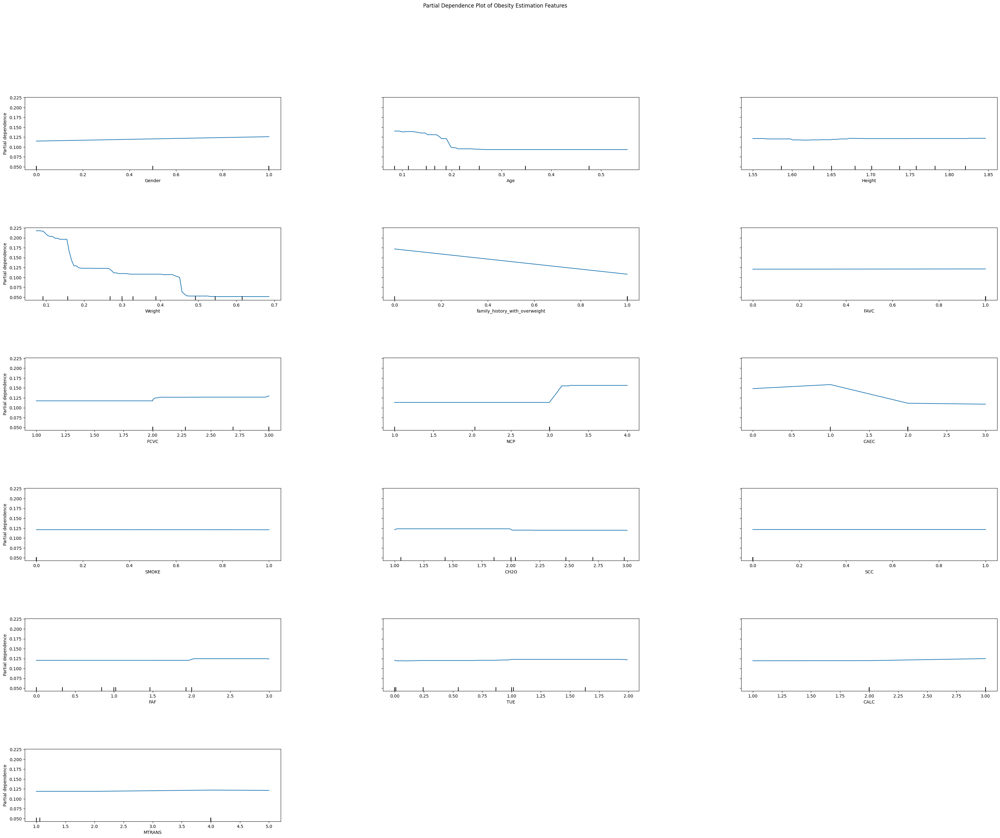

In [ ]:
# PDP Plot for Tree based Model
PartialDependenceDisplay.from_estimator(
    clf_rf,
    x_test,
    features=list(x_test.columns),
    target=clf_rf.classes_[0],
    n_jobs=3
)

fig = plt.gcf()
fig.suptitle("Partial Dependence Plot of Obesity Estimation Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (40, 30)

### SHAP (SHapley Additive exPlanations) Analysis

#### **SHAP Analysis for Linear and Tree-based Model**

SHAP values are a way to explain the output of any machine learning model by assigning each feature an importance value for a particular prediction.

Each plot shows the relationship between the feature and the predicted outcome of the model. 

* Horizontal axis represents the feature's values
* Vertical axis represents the predicted outcome
* Dotted black line represents the expected value of the model
* Blue curve represents the relationship between the feature and the predicted outcome after taking into account the SHAP values
* Red line represents the difference between the model output from the expected value

Let us take a feature Age into consideration.

* For the Linear model the cross is made at approx E[f(x)] 4.02
* For Tree-based model the cross is made at approx E[f(x)] 3.745

Hence, as the Age increases the expected value also increases.

In [ ]:
# Taking 200 samples out for SHAP analysis as it is a computationally expensive process
x_train_200 = shap.utils.sample(x_train, 200)
x_test_200 = shap.utils.sample(x_test, 200)

Permutation explainer: 201it [00:16,  9.00it/s]                         


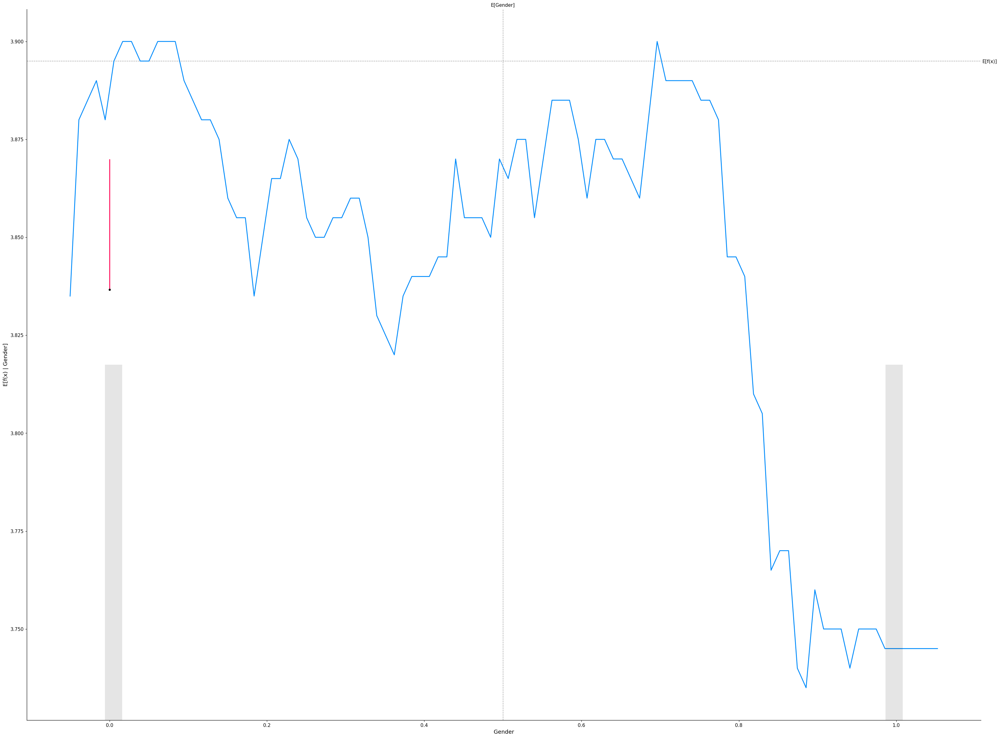

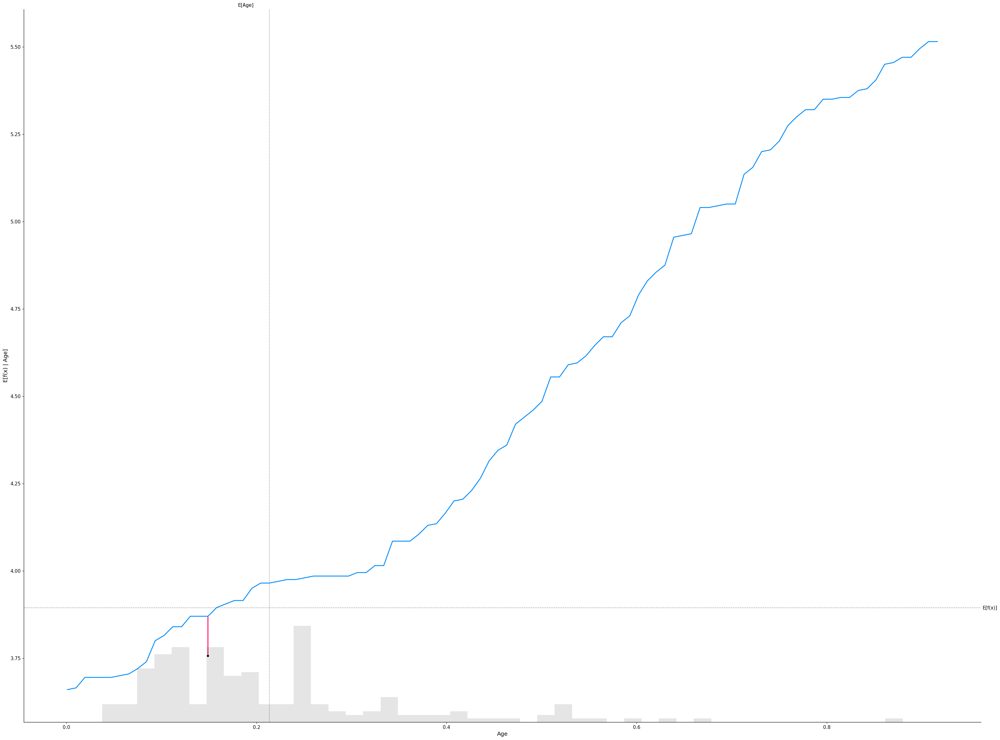

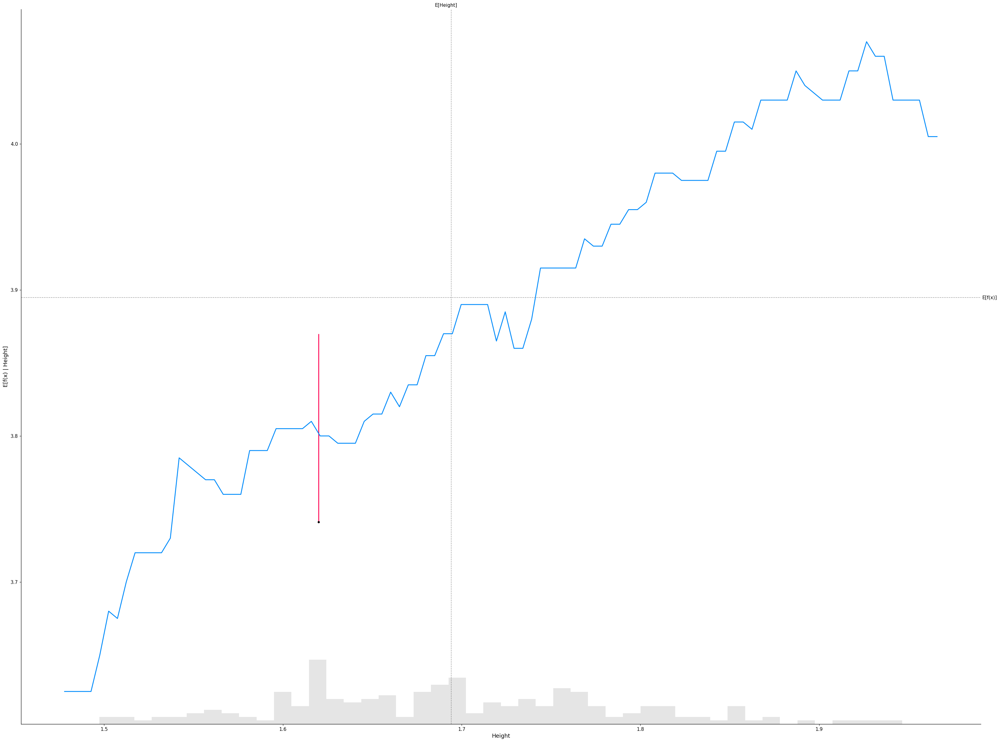

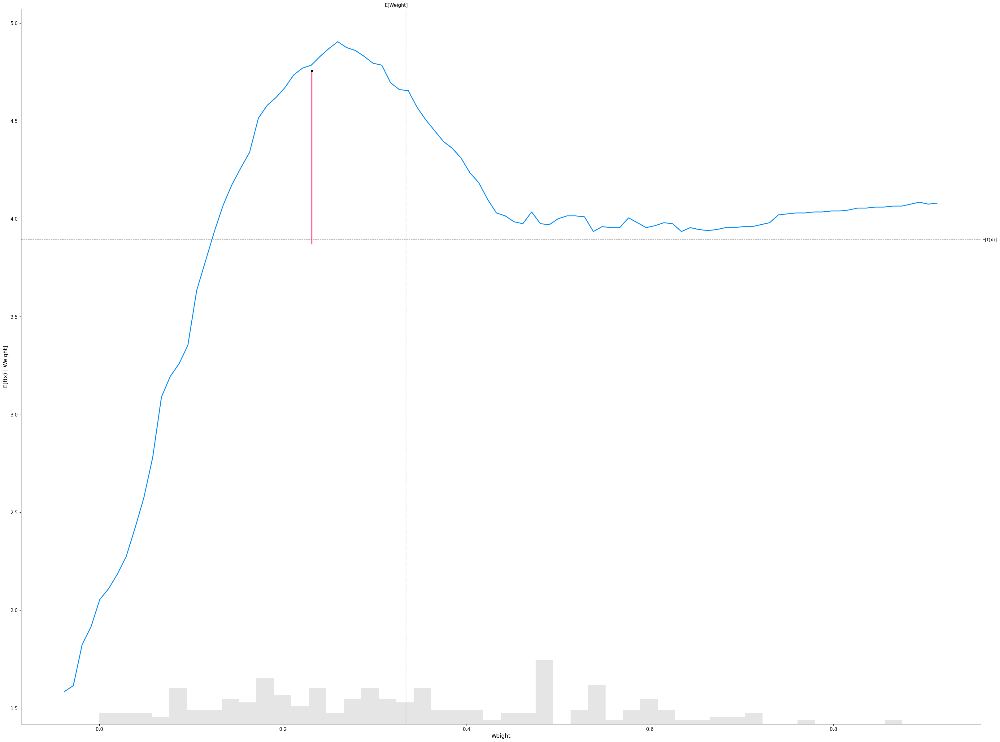

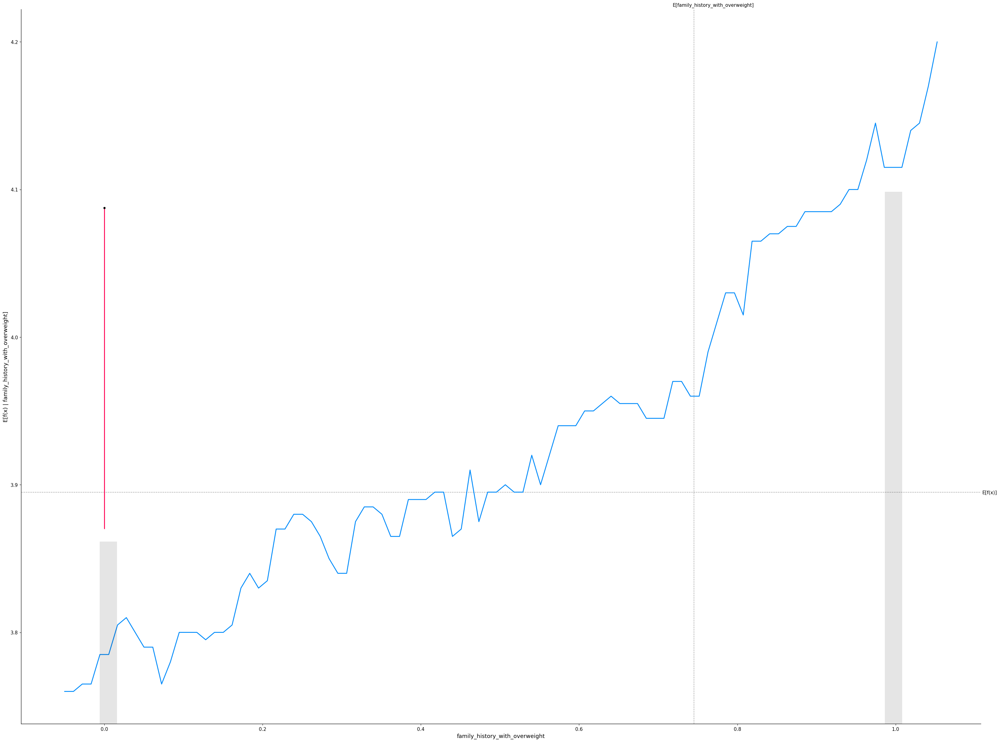

...

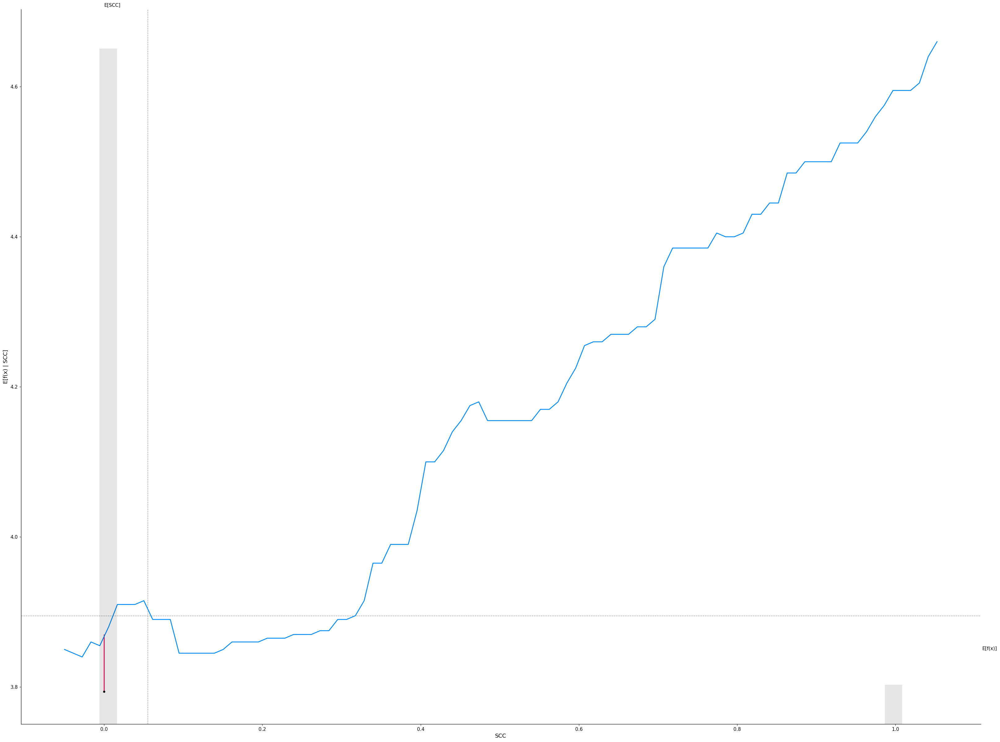

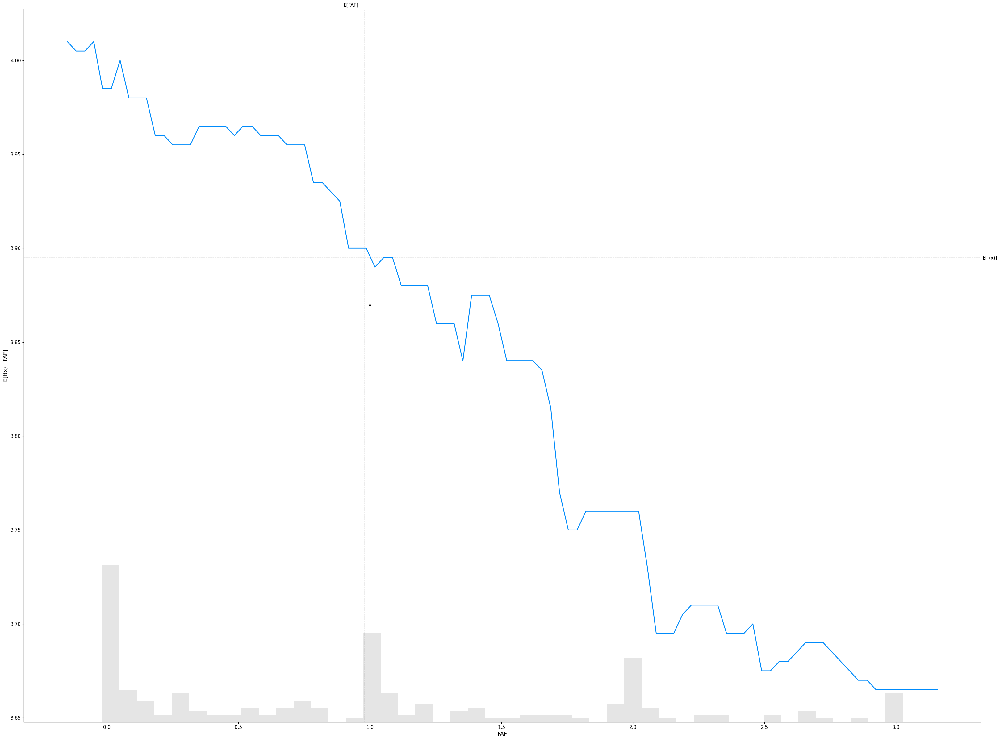

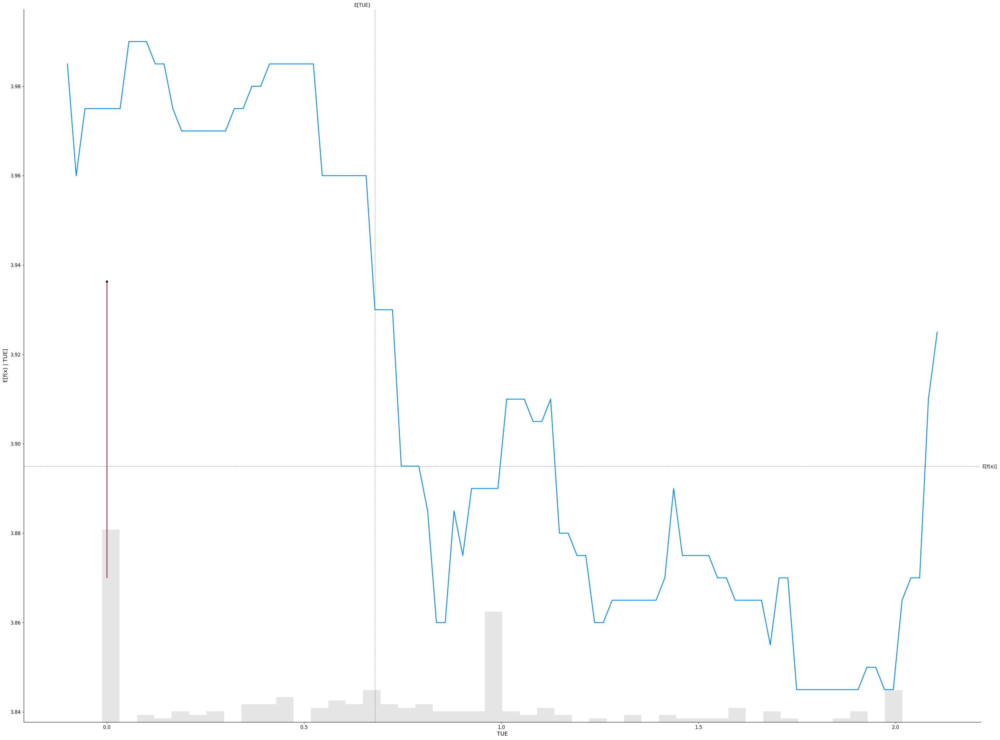

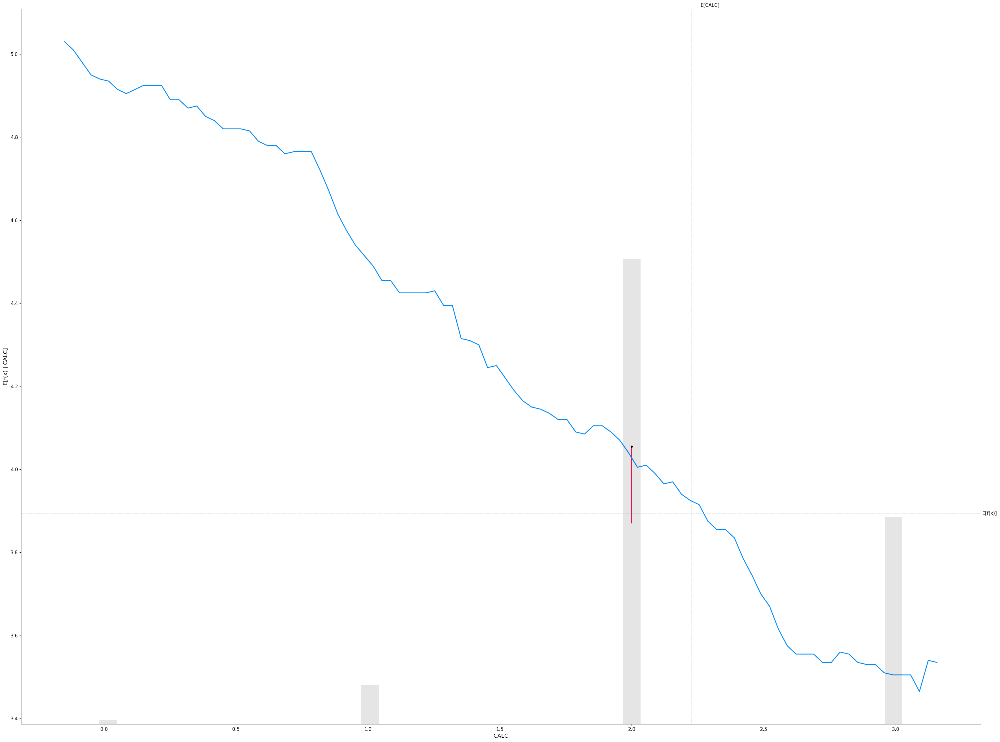

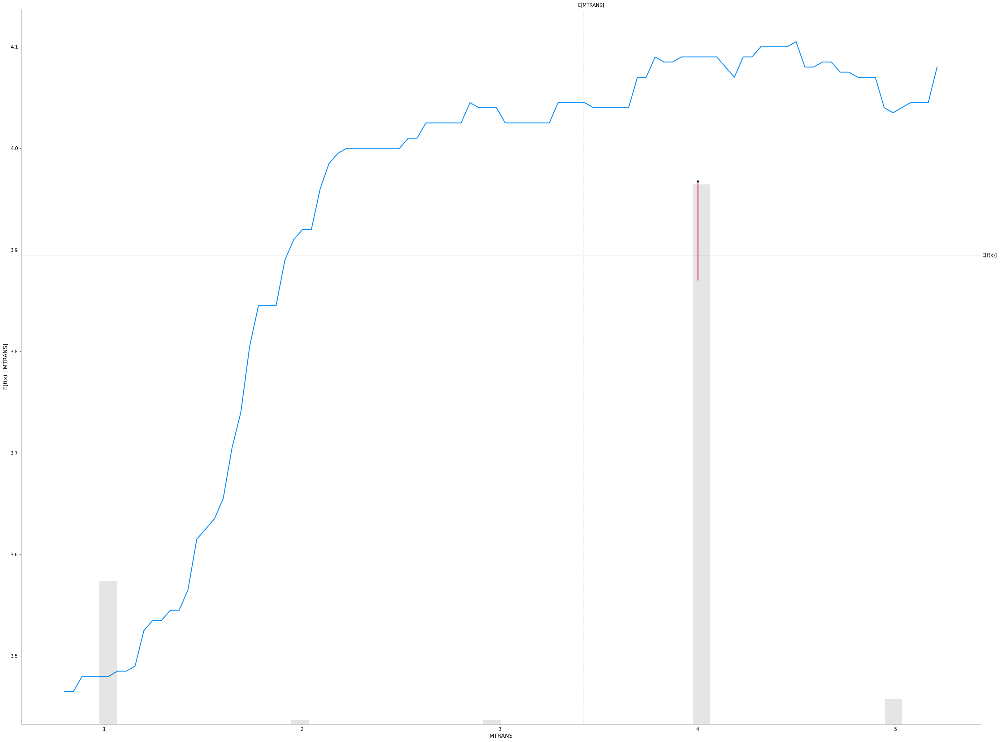

In [ ]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(clf_lr.predict, x_train_200)
linear_shap_values = linear_explainer(x_train_200)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        clf_lr.predict,
        x_train_200,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Permutation explainer: 201it [01:55,  1.58it/s]


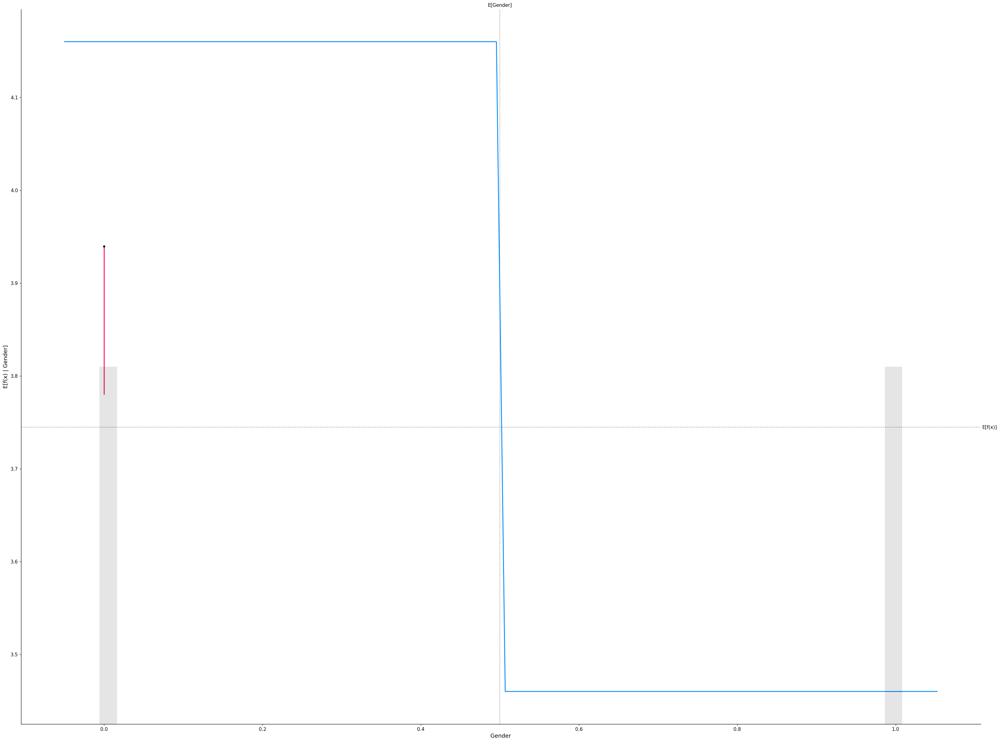

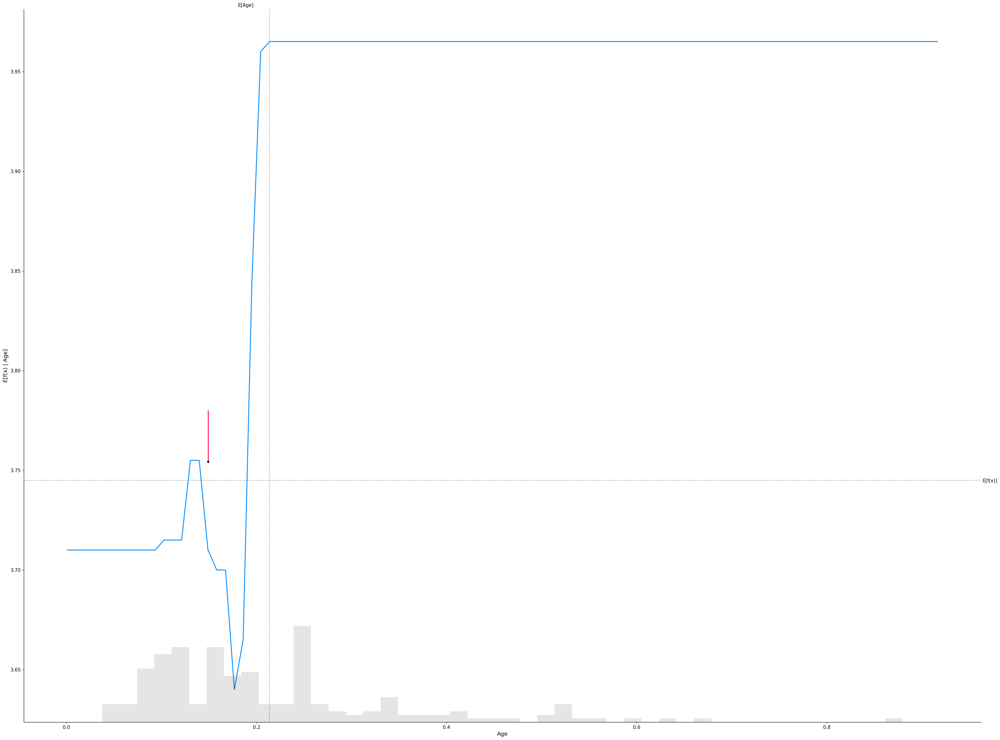

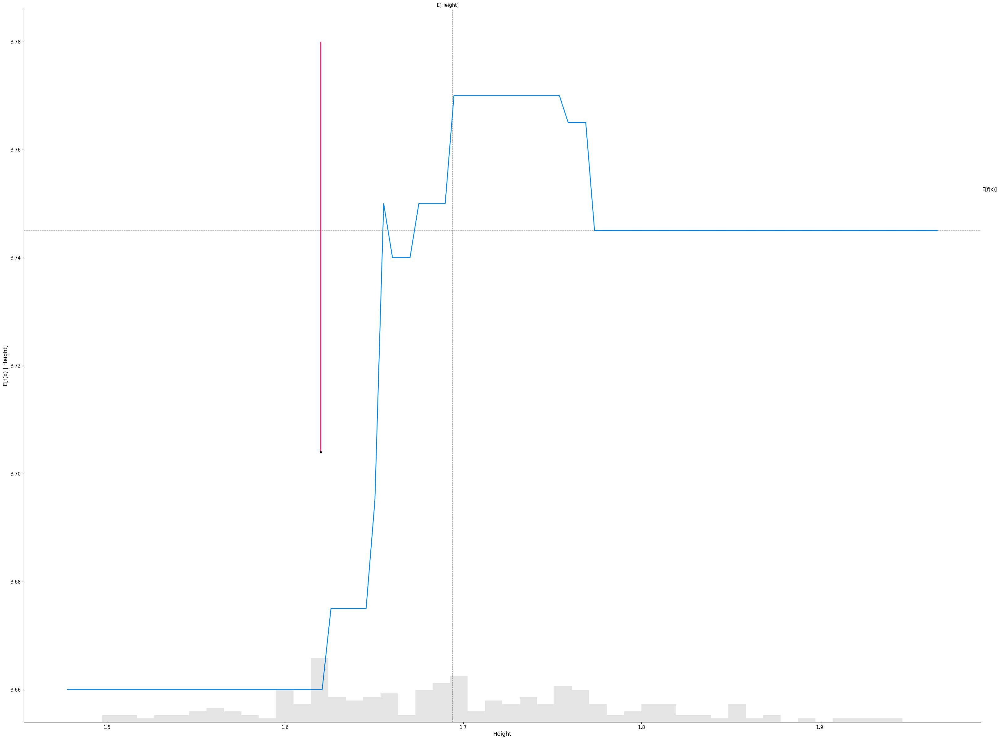

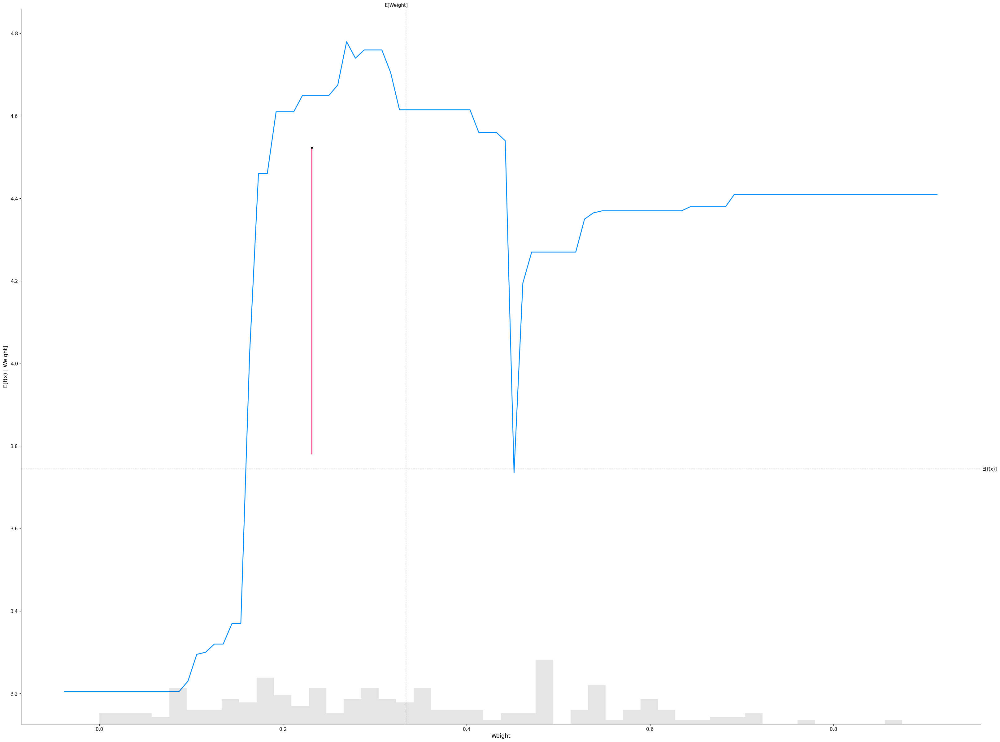

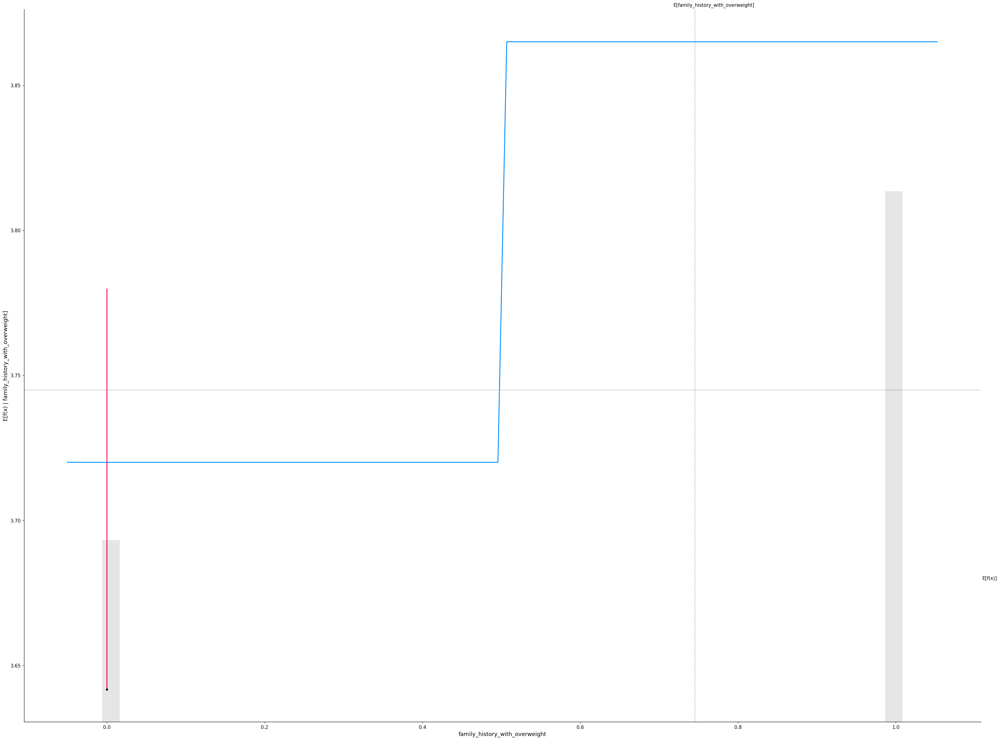

...

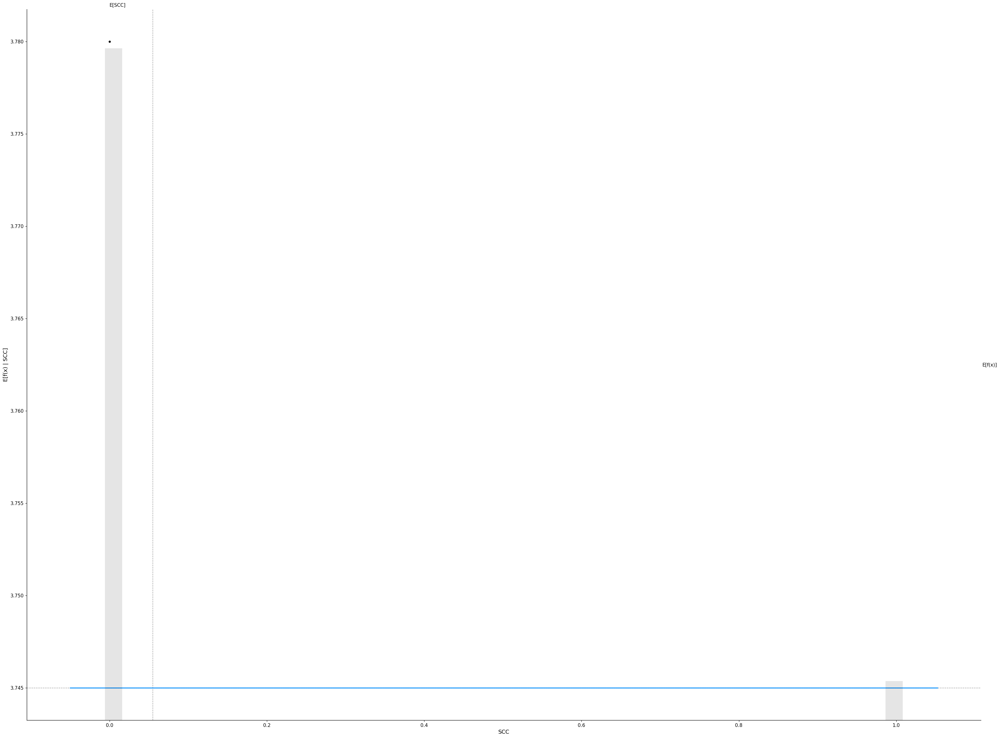

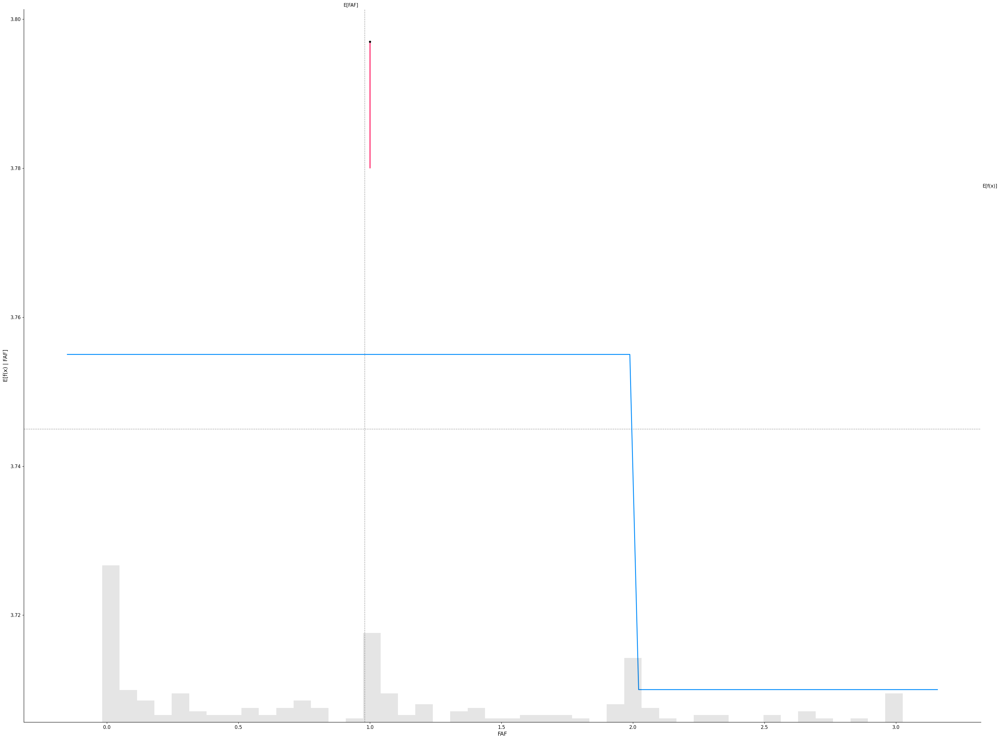

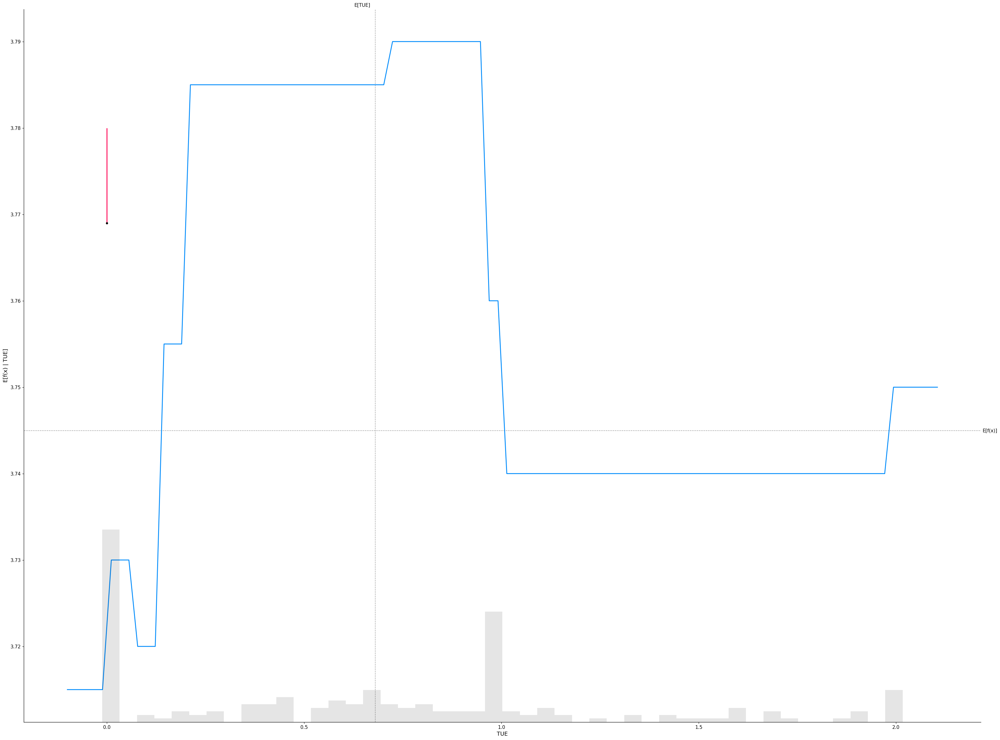

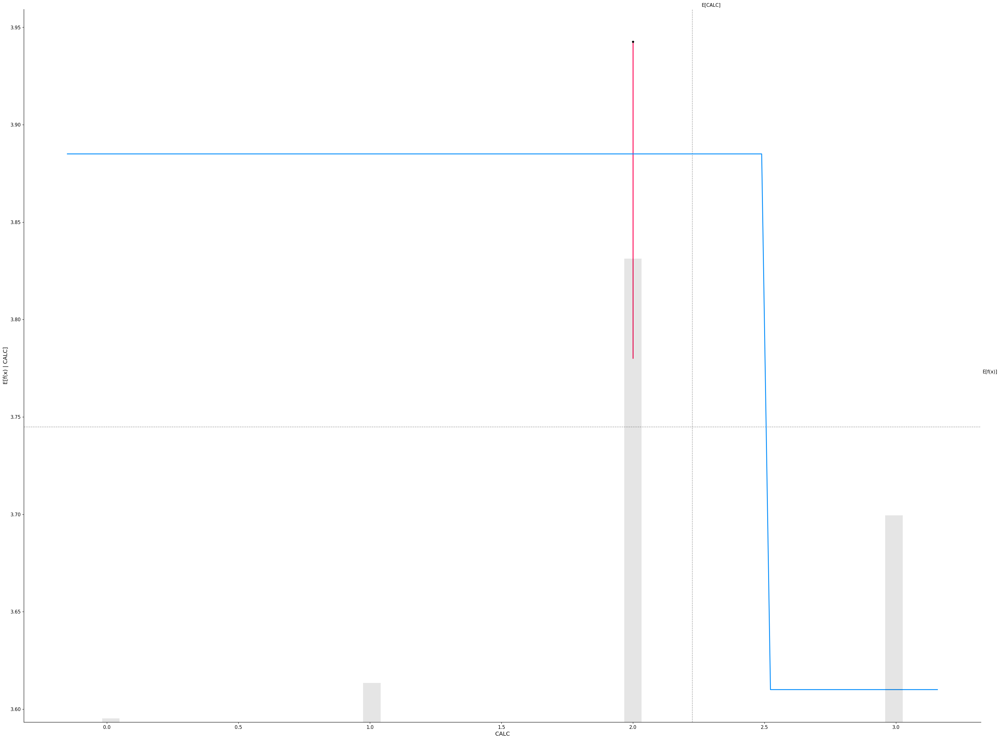

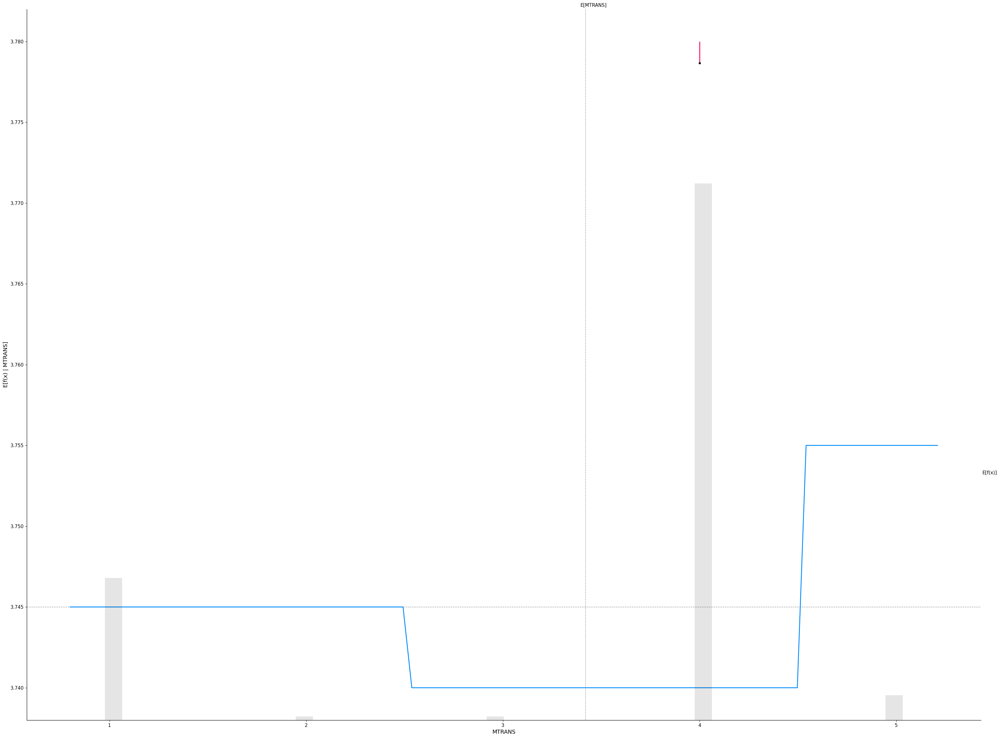

In [ ]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(clf_rf.predict, x_train_200)
tree_shap_values = tree_explainer(x_train_200)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        clf_rf.predict,
        x_train_200,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

#### **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

SHAP values provide a way to estimate the importance of each feature in the model's output for a particular instance.

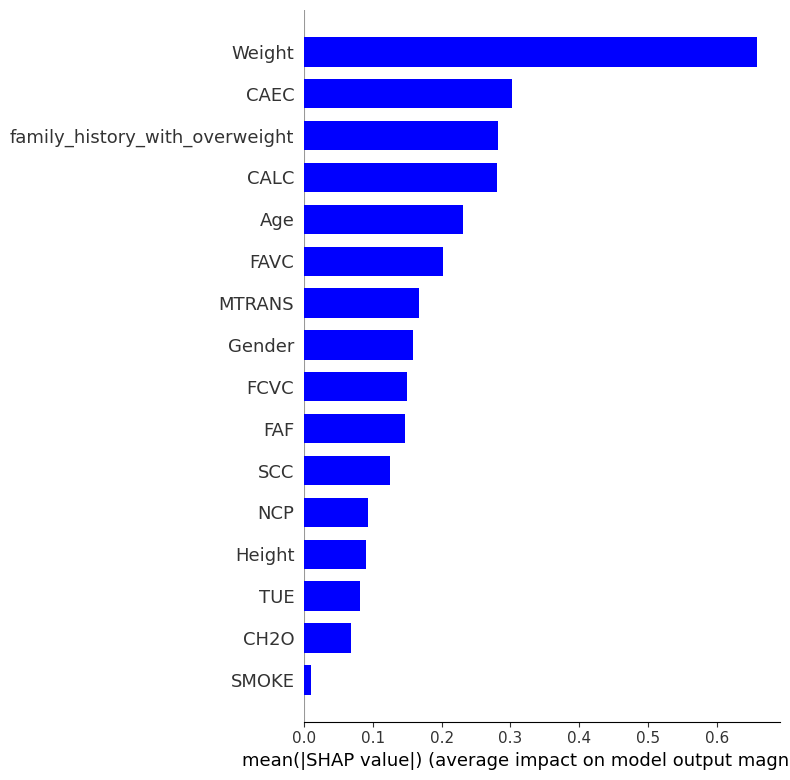

In [ ]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train_200, plot_type="bar", color="blue")

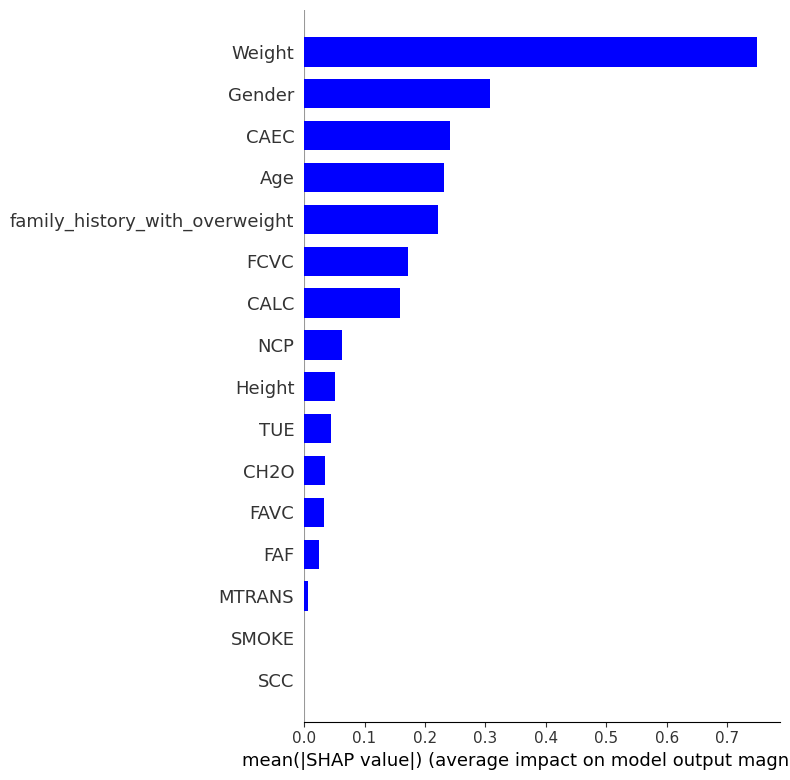

In [ ]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train_200, plot_type="bar", color="blue")

From above, we can see that the distribution of shaply values is more for Weight. 

However, to determine the positive and negative importance of the values we will see the summary of the shap values.


#### **Interpreting the Summary Plot for the Linear and Tree-based model**


The summary plot is used to understand the relationship between the features and the predicted outcome of a ML model.

It can be used to identify which features have the strongest impact on the model's prediction and whether that impact is positive or negative.


* Horizontal axis represents the SHAP value for each feature
* Vertical axis represents the features themselves
* Each dot on the plot represents a data point
* Color of a dot indicates the value of the feature for that data point:
  * Blue for low values
  * Red for high values
* Position of a dot represents the impact of the corresponding feature on the model's prediction for that data point:
 * the further it is from the axis, the greater is the impact
 * if it is on the right side of the y-axis then it has a positive impact 
 * if it is on the left side of the y-axis it has a negative impact


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


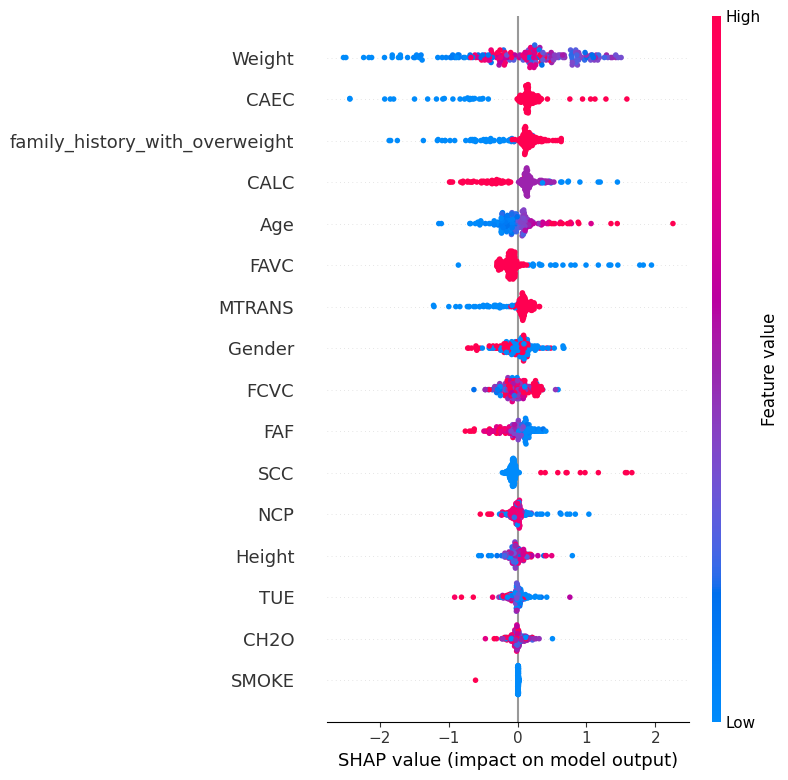

In [ ]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train_200)

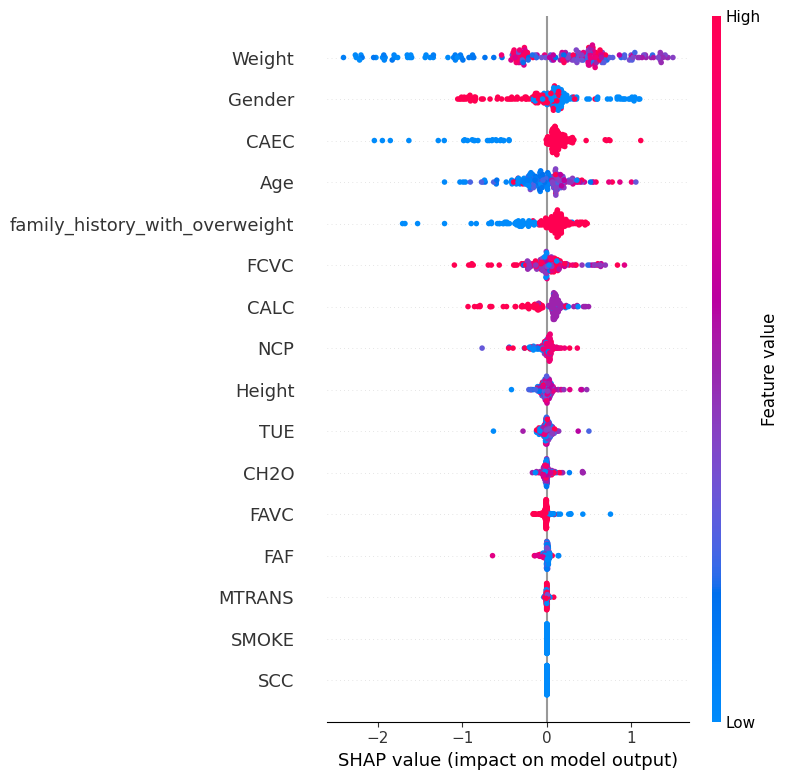

In [ ]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train_200)   

 Let us try to understand the above summary plots:

 * Higher value of Weight tends to have a positive impact on the estimation of obesity
 * Lower value of FAVC (frequency of eating high caloric food) tends to have a positive impact on the estimation of obesity
 * Higher value of Age tends to have a positive impact on the estimation of obesity


#### **Interpreting Waterfall SHAP visualization**

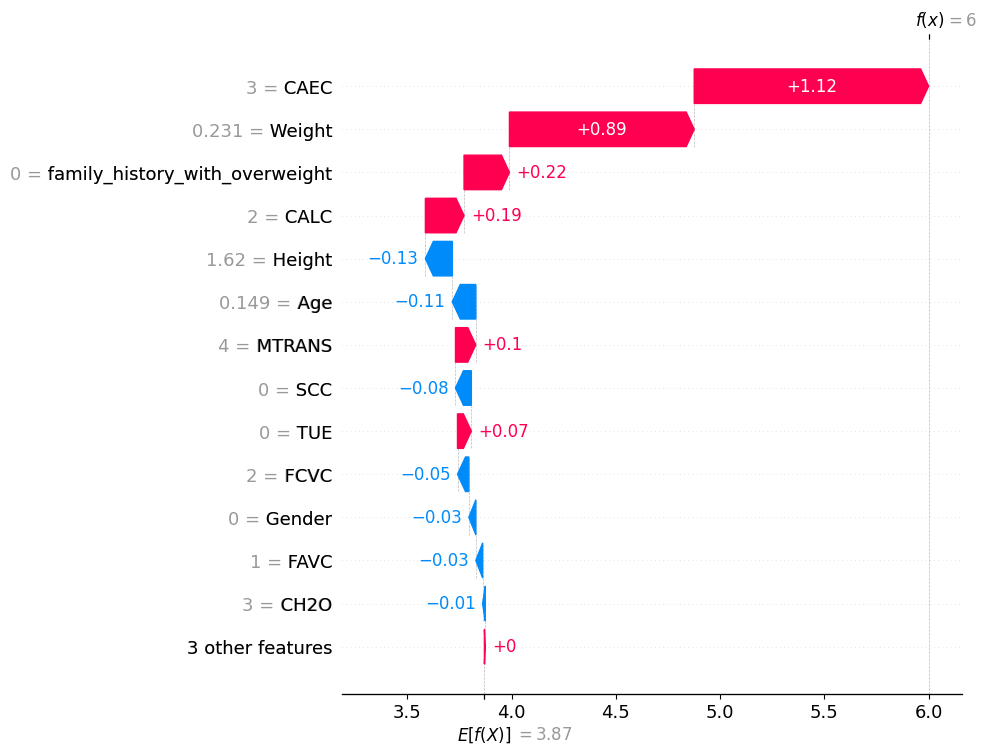

In [ ]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

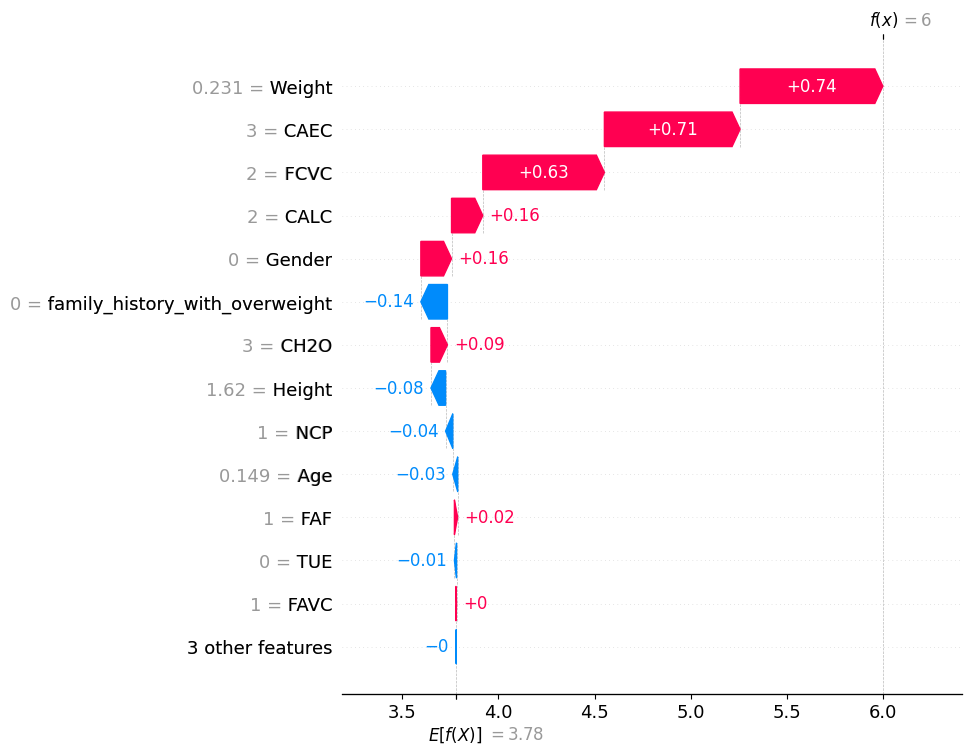

In [ ]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

We can conclude from the above waterfall plot of Linear model that for a particular sample:
* **CAEC** (frequency of eating any food between meals) has the biggest and most **positive** impact in increasing the obesity level by 1.71
* **Weight** has the subsequent **positive** impact in increasing the obesity level by 1.17
* **Age** has a **negative** impact and it bought the obesity level down by 0.13

Similarly, we can conclude from the above waterfall plot of Tree-based model that:
* **CAEC** (frequency of eating any food between meals) has the biggest and most **positive** impact in increasing the obesity level by 0.69
* **Weight** again has a **positive** impact in increasing the obesity level by 0.65

#### SHAP Dependence Plots

The SHAP dependence plot displays a scatter plot of the feature values and the corresponding SHAP values for each instance in the dataset. The plot shows how the feature value and the SHAP value are related, with the color of each point representing the value of another feature in the dataset.

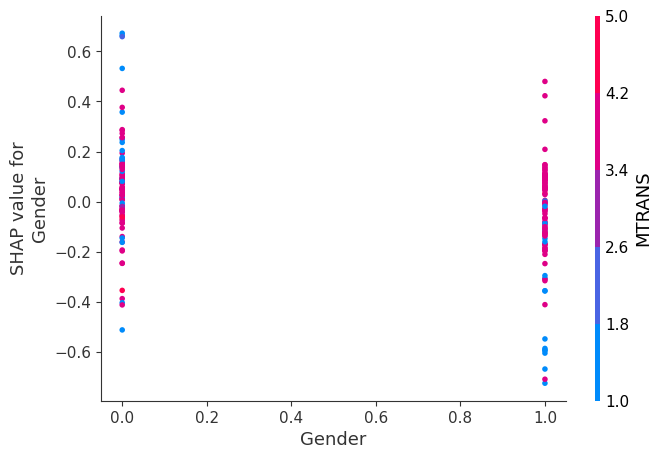

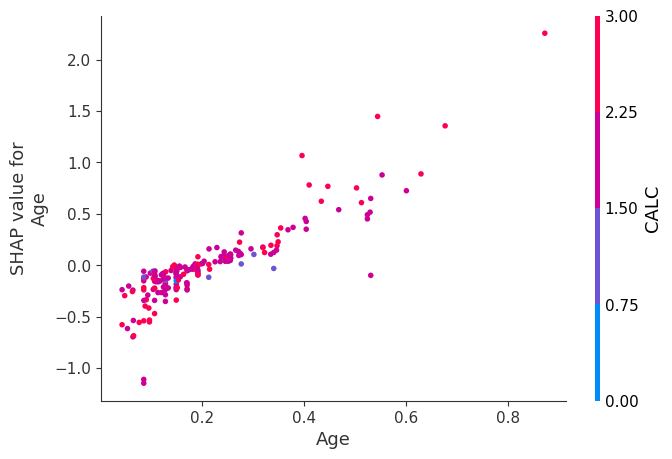

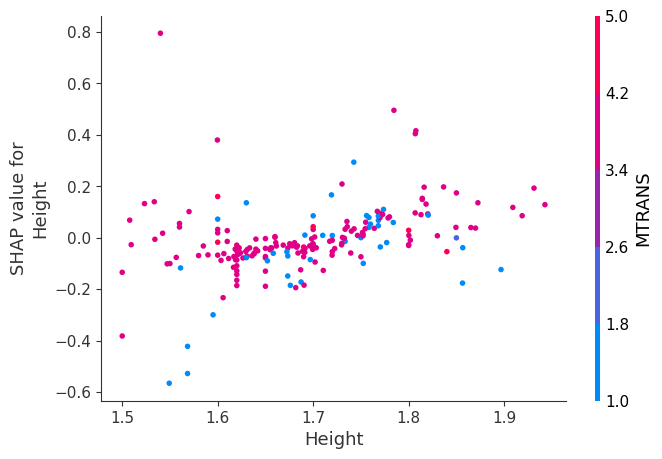

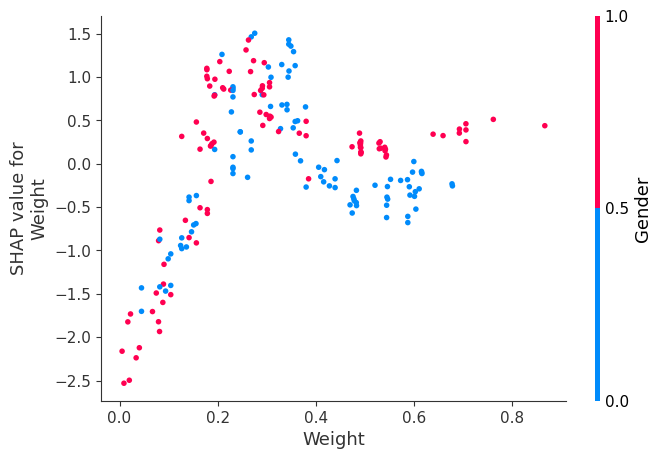

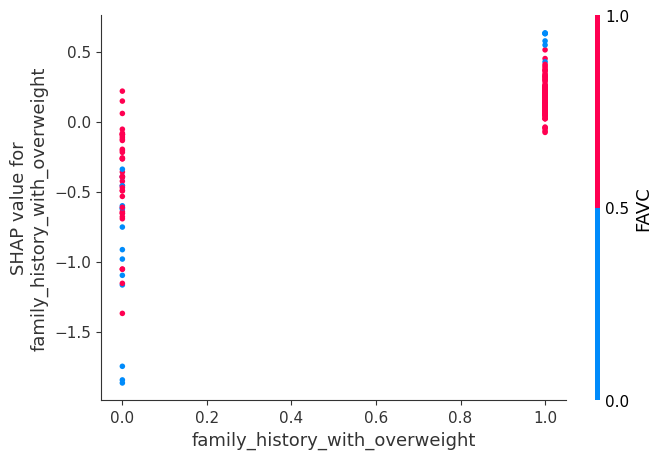

...

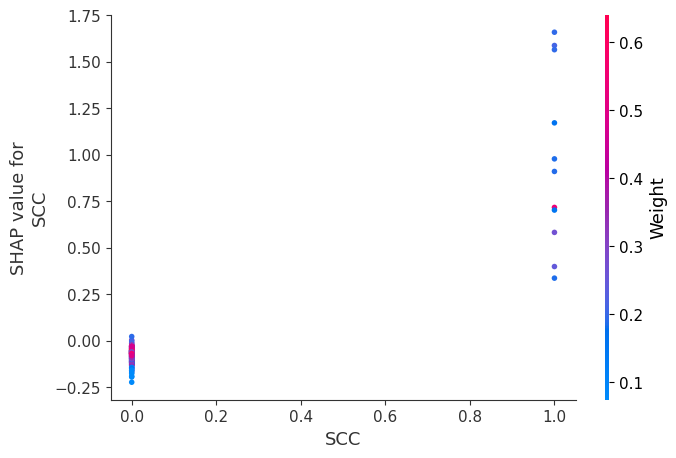

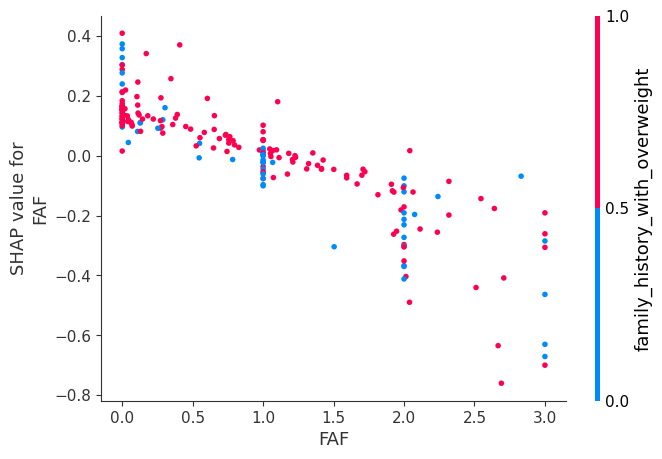

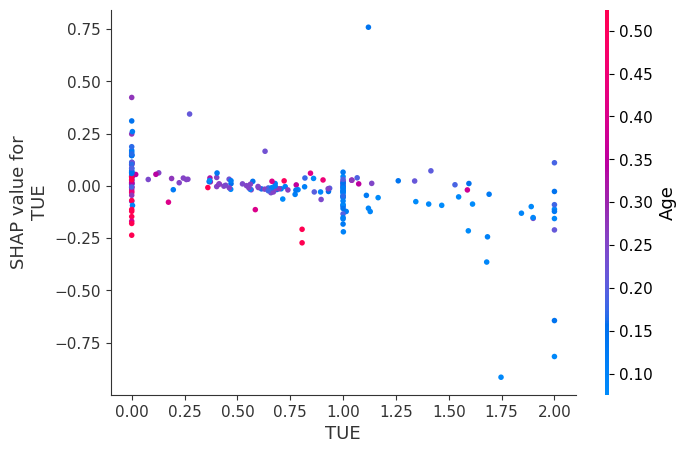

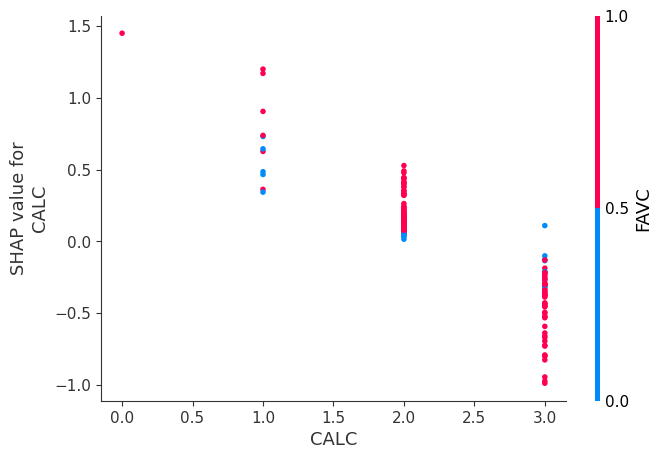

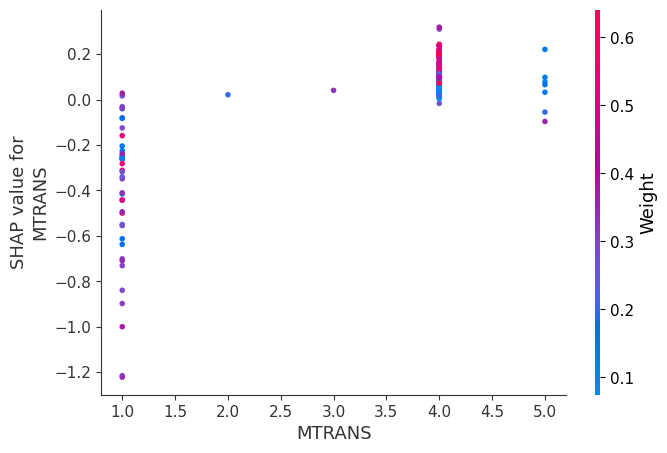

In [ ]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train_200)

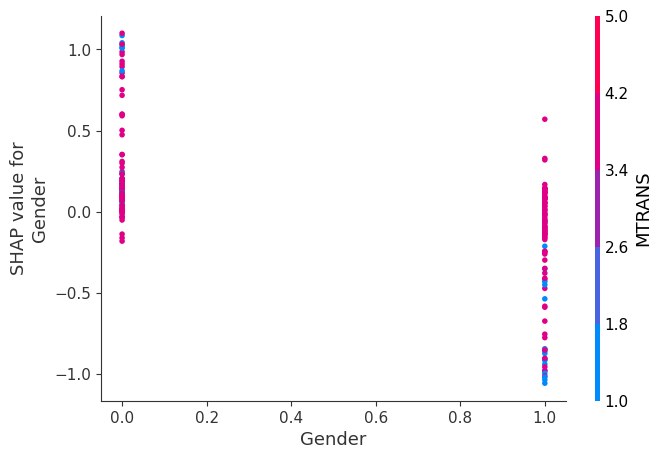

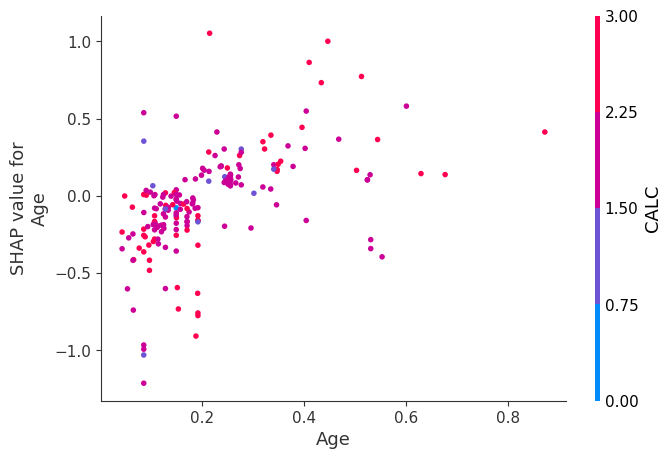

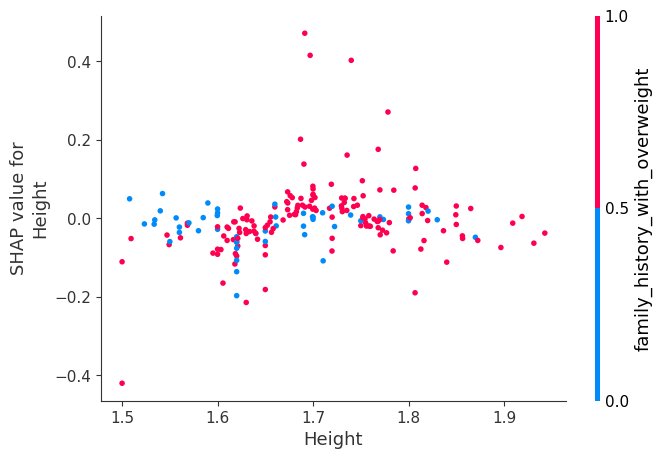

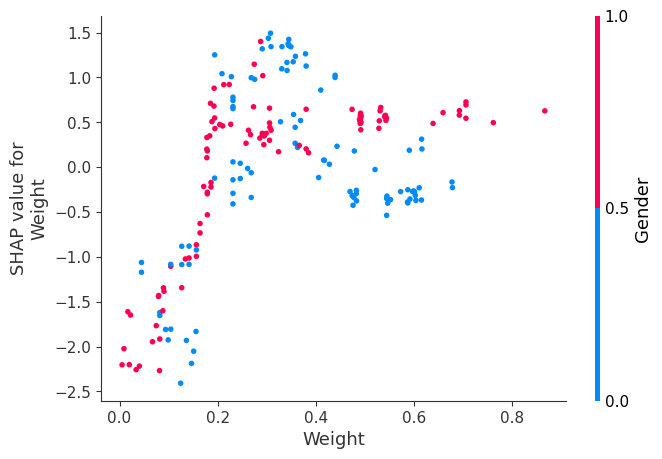

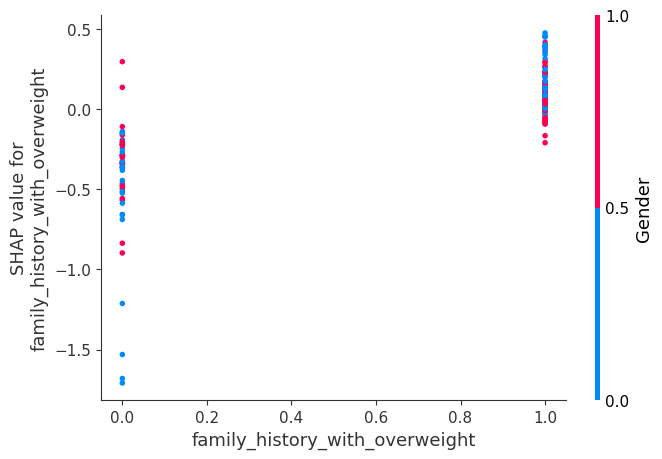

...

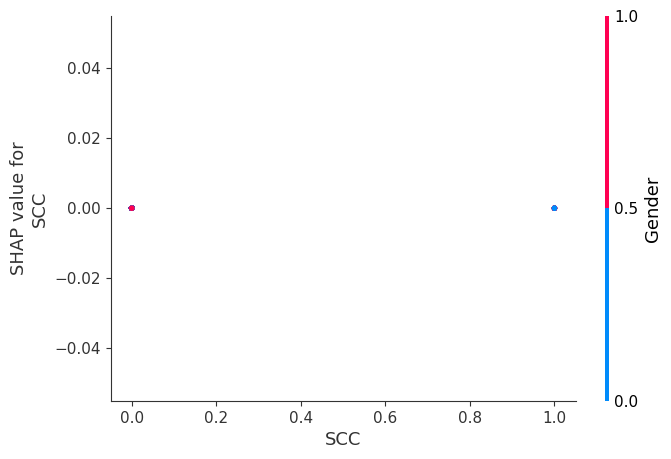

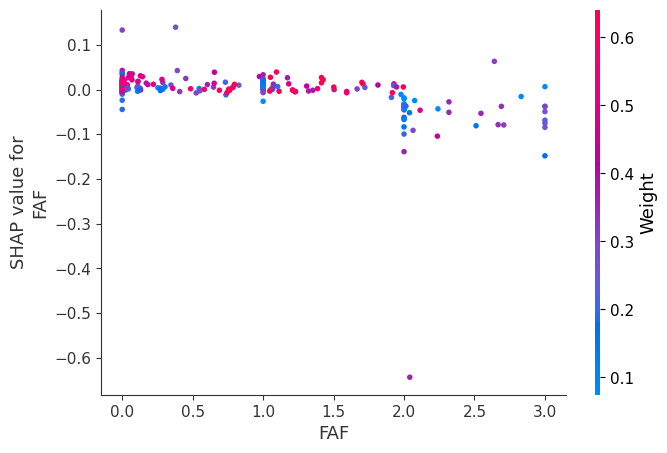

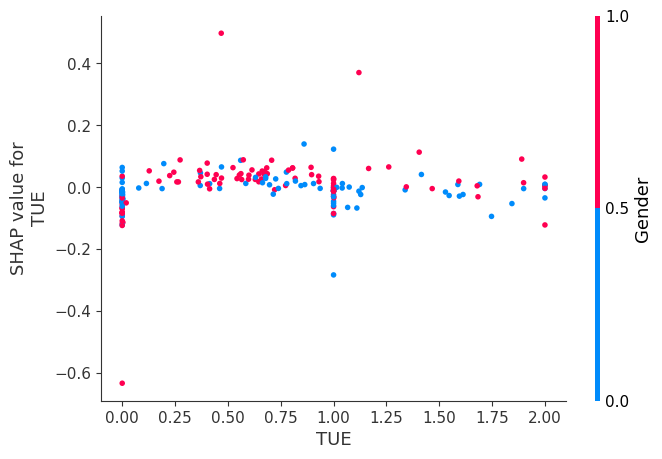

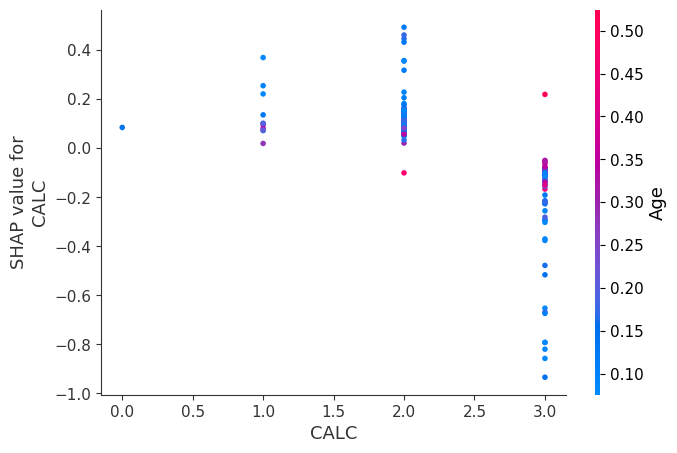

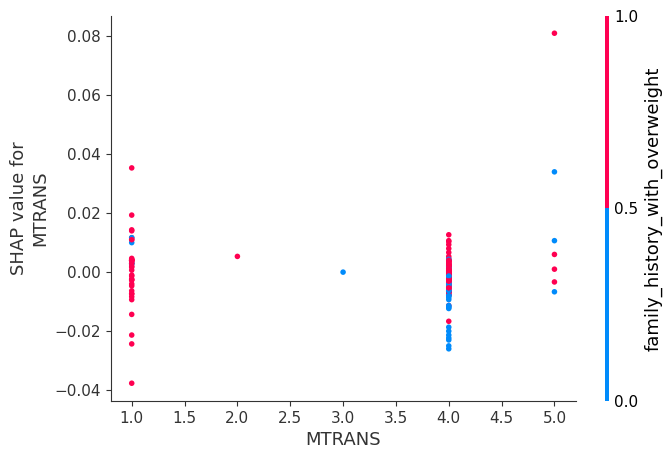

In [ ]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train_200)

#### Interpreting the Force Plot SHAP analysis

In [ ]:
# Initialize the JavaScript visualization code
shap.initjs()

ex = shap.KernelExplainer(clf_lr.predict, x_train)
shap_values = ex.shap_values(x_test.iloc[0,:])

# Generate the force plot for the sample
shap.force_plot(ex.expected_value, shap_values, x_test.iloc[0,:])

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names


In [ ]:
# Initialize the JavaScript visualization code
shap.initjs()

# Define the index of the sample you want to plot
sample_index = 0

# Attaching the output of tree based model to test dataframe
X_output_tree = x_test.copy()
explainerModel_rf = shap.TreeExplainer(clf_rf)
shap_values_rf = np.array(explainerModel_rf.shap_values(X_output_tree))

# Generate the force plot for the sample
force_plot = shap.force_plot(
    explainerModel_rf.expected_value[sample_index],
    shap_values_rf[sample_index],
    x_test.columns 
)

# Display the force plot
display(force_plot)

#### Heatmap Visualization for Linear and Tree-based model

The below heatmap visualizations displays the SHAP values for a set of features in a dataset containing 200 samples.

* Y-axis represents the features
* X-axis represents an instance of that feature
* Color of an instance indicates whether it had a positive or negative effect, with **red indicating a positive effect** and **blue indicating a negative effect**.
* Intensity of the color reflects the magnitude of the effect, with darker colors indicating stronger impact of the feature.

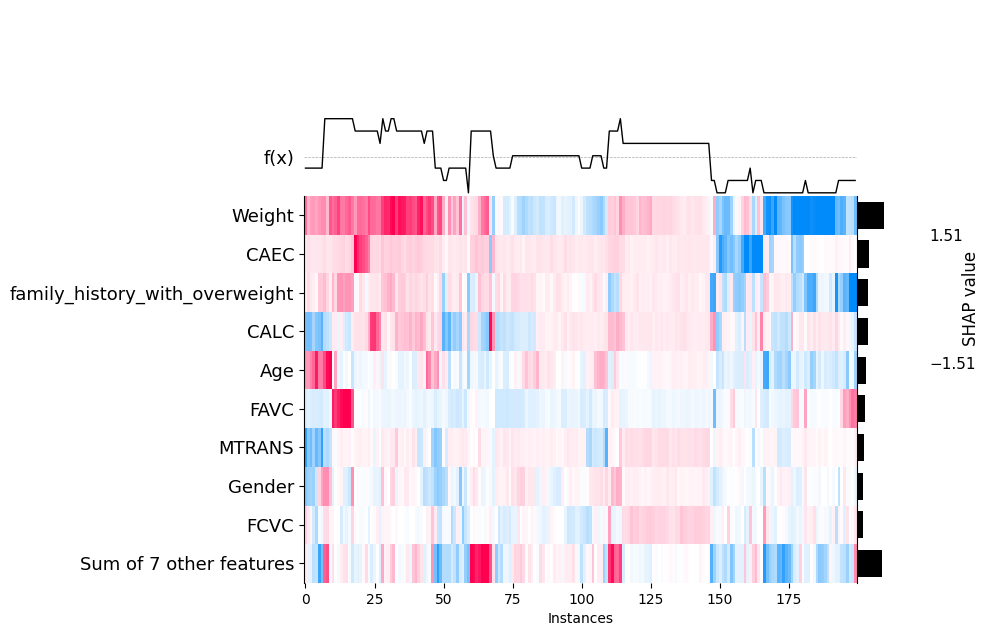

In [ ]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

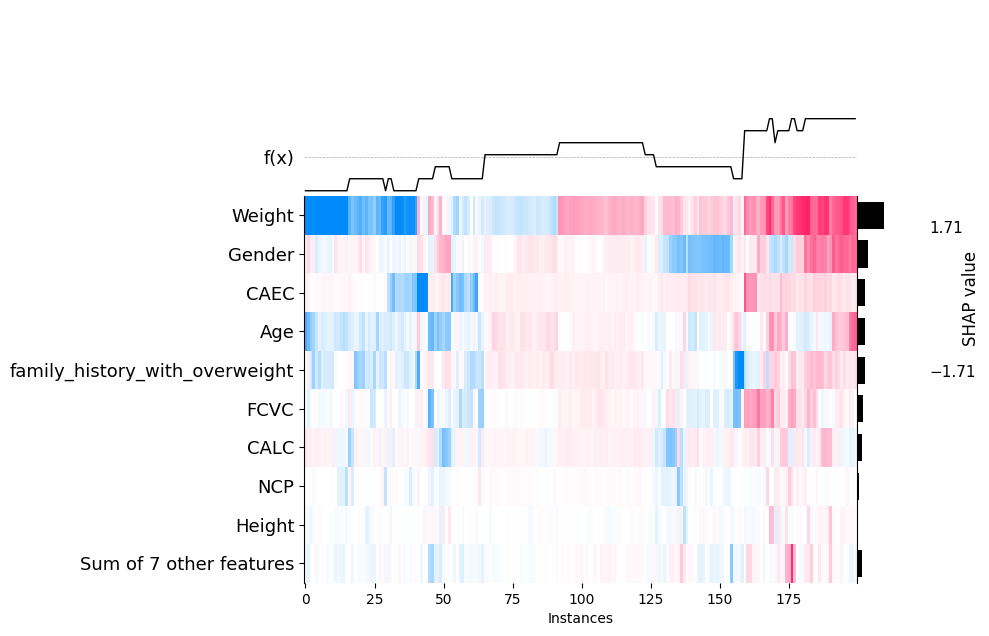

In [ ]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

### LIME (Local Interpretation Model-Agnostic Explanation) Analysis

LIME provides insight into how the model arrived at a particular prediction for a specific instance by identifying the most important features that contributed to the prediction.

LIME generates a local, interpretable model that approximates the behavior of the original model in the vicinity of the instance being explained.

Overall, LIME analysis can provide useful insights into how a machine learning model makes predictions and can help build trust and transparency in the model.

#### Linear Model

In [ ]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="classification"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 20
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", clf_lr.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], clf_lr.predict_proba, num_features=np_x_test.shape[1], top_labels=3
)

Prediction :  [1]
Actual :      [3]


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names


In [ ]:
lime_linear_explanation.show_in_notebook()

#### Tree-based Model

In [ ]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="classification"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 20
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", clf_rf.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_tree_explainer.explain_instance(
    np_x_test[idx], clf_rf.predict_proba, num_features=np_x_test.shape[1], top_labels=3
)


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names


Prediction :  [1]
Actual :      [3]


In [ ]:
lime_tree_explanation.show_in_notebook()

### Conclusion

#### **What is the question?**

In our dataset we are trying to predict the obesity level based on the input values. For this we can use Null Hypothesis to state if there is a relationship between the input and output variables.

As we can see above, the F-Statistics value is not 0 and thus we can safely assume that there is a relationship the X and Y value.

Note: F-Statistic is a way to check if there is a relationship between X-value and Y-value. If the value of F-Statistic is 0, then there is no relationship between the variables. The higher the number the more significant the realtionship is.

Further we can also look at T-Statistics values and see that some of the values imapact the values in postivie and negative way significantly. This can be further analysed using SHAP analysis.

#### **What did you do?**

For this assignment we performed 4 major steps


1.   Data cleaning/Normalization
2.   Feature selection
3.   Modeling 
4.   Interpretability

Data cleaning: In this we used correlation matrix to determine multicollinearity and scaling of data to make sure the model doesn't suffer with overfitting. 

Feature selection: In feature selection we used the same correlation matrix to determina values that have a significant positive or negative relationship to the our output variable that is 'NObeyesdad'. 

Modeling: For modeling we used linear classifier model, random forest, and autoML to determine the best performance. For further improving the performance, we optimized the hyperparameters by using grid search that is a feature of H2O. 

Interpreatability: Interpretability is a concept of understanding the model's prediction based on input. We use LIME and SHAP analysis to determine the significance of input variables and the respective output. For this we use:
* SHAP Summary Plot
* SHAP Waterfall Plot
* SHAP Dependance Plot</br>

From above we figured out the relationship of various variables and whether they have a positive or negative impact and by what degree.</br></br>


#### **How well did it work?**

We used OLS summary to determine the null hypothesis. As there was a significant relationship, we could predict the obesity level from the input variables. The performance of the model can be determined by Accuracy and Root Mean Squared error and for our test we have used:
1. Linear regression
2. Random Forest
3. AutoML 

Below are the details and performance of the training:

|Model|Performance|
|-----------|:------|
|Logistic Regression Classifier| Accuracy: 0.68|
|Random Forest classifier| Accuracy: 0.66|
| AutoML (H2OGradientBoostingEstimator : Gradient Boosting Machine)| RMSE: 0.58|

From this we can see that the model performed well enough.</br>

#### **What did you learn?**
From this article, we comprehended about data cleansing, feature selection, variable importance, model types, performance indicators of a model and its output, model performance optimization, and how to interpret a model's output depending on the input provided. 

These fundamental ideas will aid in further data analysis and enable us to choose the most appropriate model for the dataset. The lessons from the article can also be used to further evaluate a model's output, which will aid in understanding the hyperparameters and how to tune them. 

### References

1.   https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html
2.   https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html
3.   https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb
4.   https://www.geeksforgeeks.org/how-to-create-a-residual-plot-in-python/
5.   https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb
6. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb
7. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb
8. https://mljar.com/blog/feature-importance-in-random-forest/




###MIT License

Copyright (c) 2023 Dipika Mohanty

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.